# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

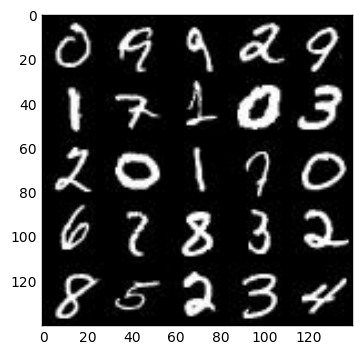

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

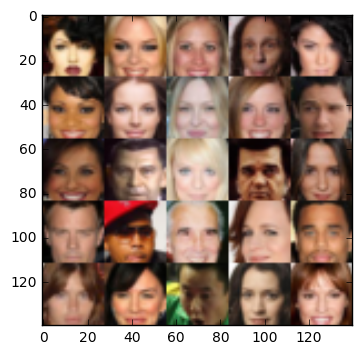

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    
    real_inputs = tf.placeholder(tf.float32,(None, image_width, image_height, image_channels), name = 'inputs_real')
    
    z_inputs = tf.placeholder(tf.float32, (None, z_dim), name = 'inputs_z')
    
    learning_rate = tf.placeholder(tf.float32, name = 'learning_rate')

    return real_inputs, z_inputs, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False, alpha=0.2):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    
    with tf.variable_scope('discriminator', reuse=reuse):
        
        # 28x28x3
        
        x1 = tf.layers.conv2d(images, 64, 4, strides=2, padding='same', kernel_initializer = tf.random_normal_initializer(stddev=0.02))
        relu1 = tf.maximum(alpha * x1, x1)
        
        #print(relu1.shape)
        # now 14x14x64
        
        x2 = tf.layers.conv2d(relu1, 128, 4, strides=2, padding='same', kernel_initializer = tf.random_normal_initializer(stddev=0.02))
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        
        #print(relu2.shape)
        #now 7x7x128
        
        x3 = tf.layers.conv2d(relu2, 256, 4, strides=2, padding='same', kernel_initializer = tf.random_normal_initializer(stddev=0.02))
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        
        #print(relu3.shape)
        #now 4x4x256
        
        
        
        x4 = tf.layers.conv2d(relu3, 512, 4, strides=2, padding='same', kernel_initializer = tf.random_normal_initializer(stddev=0.02))
        bn4 = tf.layers.batch_normalization(x4, training=True)
        relu4 = tf.maximum(alpha * bn4, bn4)
        #print(relu4.shape)
        #now 2x2x512
        
        
        
        
        flat = tf.reshape(relu4, (-1, 2*2*512))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)

    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True, alpha=0.2):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    with tf.variable_scope('generator', reuse=not is_train):
        
        x1 = tf.layers.dense(z, 2*2*512)
        x1 = tf.reshape(x1, (-1, 2, 2, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        
        #print(x1.shape)
        # here 2x2x512
        
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 4, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        
        #print('x2',x2.shape)
        #here 4x4x256
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 4, strides=1, padding='valid')
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)
        
        #here 7x7x128
        #print('x3',x3.shape)
       
        
        x4 = tf.layers.conv2d_transpose(x3, 64, 4, strides=2, padding='same')
        x4 = tf.layers.batch_normalization(x4, training=is_train)
        x4 = tf.maximum(alpha * x4, x4)
        #here 14x14x64
        #print('x4',x4.shape)
        

        logits = tf.layers.conv2d_transpose(x4, out_channel_dim, 5, strides=2, padding="SAME")
        
        out = tf.tanh(logits)
    
    return out
    
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    
    g_model = generator(input_z, out_channel_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function    
    
    t_vars = tf.trainable_variables()
    
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    
    update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
    
    g_update_ops = [var for var in update_ops if var.name.startswith('generator')]
    d_update_ops = [var for var in update_ops if var.name.startswith('discriminator')]

    with tf.control_dependencies(d_update_ops):
        d_train_operation = tf.train.AdamOptimizer(learning_rate,beta1=beta1).minimize(d_loss, var_list=d_vars)
    with tf.control_dependencies(g_update_ops):
        g_train_operation = tf.train.AdamOptimizer(learning_rate,beta1=beta1).minimize(g_loss, var_list=g_vars)
    return d_train_operation, g_train_operation
    


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    
    _, image_width, image_height, image_channels = data_shape
    
    # Model inputse
    input_real, input_z, _learning_rate = model_inputs(image_width, image_height, image_channels, z_dim)
    
    # Losses
    d_loss, g_loss = model_loss(input_real, input_z, image_channels)
    
    # Optimization
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    # Steps
    steps = 0
    
    # Number of images to print
    n_images = 25
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epoch_count):
            for batch_images in get_batches(batch_size):
                
                # Multiply batch_images by 2.0 since the dataset ranges from -0.5 to 0.5
                batch_images = batch_images*2.0
                
                # Random noise for generator
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                # Run optimizers
                _ = sess.run(d_train_opt, feed_dict={input_real: batch_images, input_z: batch_z})
                _ = sess.run(g_train_opt, feed_dict={input_z: batch_z})
                
                # Increment the batch count
                steps += 1

                # Print the d_train_loss and g_train_loss every 10 batches
                if (steps % 10 == 0):
                    train_loss_d = sess.run(d_loss, {input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})
                    
                    print("Epoch {}/{} Step{}...".format(e+1, epochs, steps),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))   
                    
                # Print the generator output every 100 batches
                if (steps % 100 == 0):
                    show_generator_output(sess, n_images, input_z, image_channels, data_image_mode)
                
                
                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2 Step10... Discriminator Loss: 0.0148... Generator Loss: 7.1205
Epoch 1/2 Step20... Discriminator Loss: 0.3922... Generator Loss: 1.1469
Epoch 1/2 Step30... Discriminator Loss: 2.1046... Generator Loss: 0.1414
Epoch 1/2 Step40... Discriminator Loss: 1.0673... Generator Loss: 9.7625
Epoch 1/2 Step50... Discriminator Loss: 0.3045... Generator Loss: 1.6628
Epoch 1/2 Step60... Discriminator Loss: 1.1583... Generator Loss: 8.2484
Epoch 1/2 Step70... Discriminator Loss: 0.3952... Generator Loss: 1.8654
Epoch 1/2 Step80... Discriminator Loss: 0.6760... Generator Loss: 1.3243
Epoch 1/2 Step90... Discriminator Loss: 3.2984... Generator Loss: 8.3054
Epoch 1/2 Step100... Discriminator Loss: 0.1262... Generator Loss: 2.8612


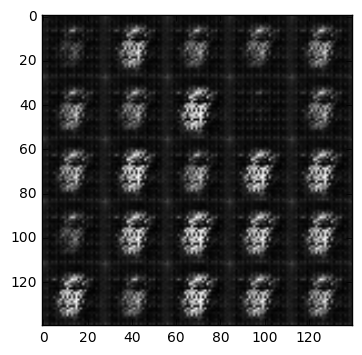

Epoch 1/2 Step110... Discriminator Loss: 4.6791... Generator Loss: 12.3667
Epoch 1/2 Step120... Discriminator Loss: 0.1629... Generator Loss: 3.8925
Epoch 1/2 Step130... Discriminator Loss: 0.5136... Generator Loss: 1.4224
Epoch 1/2 Step140... Discriminator Loss: 0.0092... Generator Loss: 6.1953
Epoch 1/2 Step150... Discriminator Loss: 0.1107... Generator Loss: 5.8735
Epoch 1/2 Step160... Discriminator Loss: 0.1225... Generator Loss: 3.5620
Epoch 1/2 Step170... Discriminator Loss: 0.1117... Generator Loss: 3.1951
Epoch 1/2 Step180... Discriminator Loss: 2.0903... Generator Loss: 0.2899
Epoch 1/2 Step190... Discriminator Loss: 0.3888... Generator Loss: 4.4288
Epoch 1/2 Step200... Discriminator Loss: 2.6919... Generator Loss: 0.1465


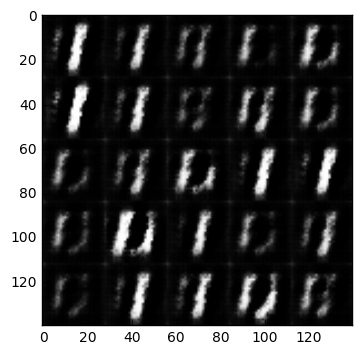

Epoch 1/2 Step210... Discriminator Loss: 0.3559... Generator Loss: 2.0166
Epoch 1/2 Step220... Discriminator Loss: 3.1750... Generator Loss: 0.0524
Epoch 1/2 Step230... Discriminator Loss: 0.7555... Generator Loss: 2.0077
Epoch 1/2 Step240... Discriminator Loss: 0.4066... Generator Loss: 4.6157
Epoch 1/2 Step250... Discriminator Loss: 0.5032... Generator Loss: 1.3942
Epoch 1/2 Step260... Discriminator Loss: 0.0436... Generator Loss: 5.4860
Epoch 1/2 Step270... Discriminator Loss: 0.1158... Generator Loss: 2.6617
Epoch 1/2 Step280... Discriminator Loss: 0.1999... Generator Loss: 4.3550
Epoch 1/2 Step290... Discriminator Loss: 0.1191... Generator Loss: 2.4161
Epoch 1/2 Step300... Discriminator Loss: 1.6090... Generator Loss: 0.5760


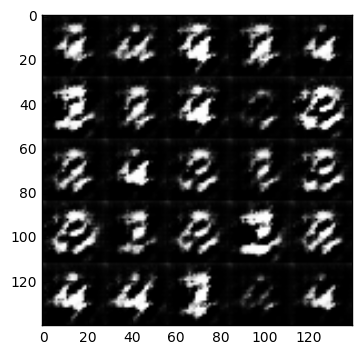

Epoch 1/2 Step310... Discriminator Loss: 0.3324... Generator Loss: 1.9176
Epoch 1/2 Step320... Discriminator Loss: 0.2511... Generator Loss: 2.6749
Epoch 1/2 Step330... Discriminator Loss: 0.6907... Generator Loss: 3.1504
Epoch 1/2 Step340... Discriminator Loss: 0.1462... Generator Loss: 2.8938
Epoch 1/2 Step350... Discriminator Loss: 0.3436... Generator Loss: 2.7980
Epoch 1/2 Step360... Discriminator Loss: 0.1585... Generator Loss: 4.0912
Epoch 1/2 Step370... Discriminator Loss: 0.8748... Generator Loss: 1.0230
Epoch 1/2 Step380... Discriminator Loss: 0.5284... Generator Loss: 2.0988
Epoch 1/2 Step390... Discriminator Loss: 0.4994... Generator Loss: 3.6555
Epoch 1/2 Step400... Discriminator Loss: 0.4266... Generator Loss: 3.4111


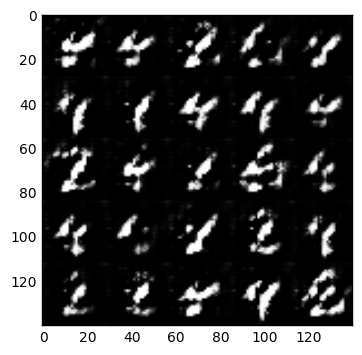

Epoch 1/2 Step410... Discriminator Loss: 0.2311... Generator Loss: 4.3043
Epoch 1/2 Step420... Discriminator Loss: 0.4925... Generator Loss: 1.3558
Epoch 1/2 Step430... Discriminator Loss: 1.5297... Generator Loss: 0.4782
Epoch 1/2 Step440... Discriminator Loss: 0.5685... Generator Loss: 1.2429
Epoch 1/2 Step450... Discriminator Loss: 0.4098... Generator Loss: 2.0917
Epoch 1/2 Step460... Discriminator Loss: 0.1027... Generator Loss: 5.4813
Epoch 1/2 Step470... Discriminator Loss: 0.4535... Generator Loss: 4.0820
Epoch 1/2 Step480... Discriminator Loss: 0.4091... Generator Loss: 2.3860
Epoch 1/2 Step490... Discriminator Loss: 0.3342... Generator Loss: 2.3287
Epoch 1/2 Step500... Discriminator Loss: 0.3408... Generator Loss: 4.3171


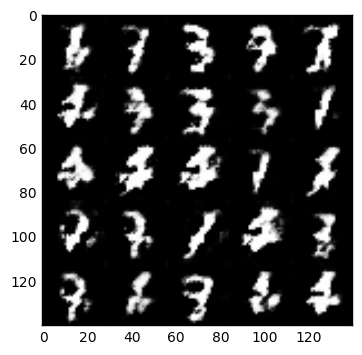

Epoch 1/2 Step510... Discriminator Loss: 0.9358... Generator Loss: 0.8358
Epoch 1/2 Step520... Discriminator Loss: 0.2974... Generator Loss: 2.2850
Epoch 1/2 Step530... Discriminator Loss: 0.2835... Generator Loss: 1.9892
Epoch 1/2 Step540... Discriminator Loss: 0.6417... Generator Loss: 1.8303
Epoch 1/2 Step550... Discriminator Loss: 0.3878... Generator Loss: 1.7684
Epoch 1/2 Step560... Discriminator Loss: 0.2039... Generator Loss: 3.5750
Epoch 1/2 Step570... Discriminator Loss: 0.4624... Generator Loss: 1.7901
Epoch 1/2 Step580... Discriminator Loss: 0.4003... Generator Loss: 2.7069
Epoch 1/2 Step590... Discriminator Loss: 0.5241... Generator Loss: 1.5644
Epoch 1/2 Step600... Discriminator Loss: 0.8779... Generator Loss: 1.0320


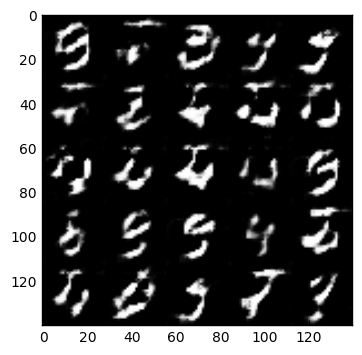

Epoch 1/2 Step610... Discriminator Loss: 0.6048... Generator Loss: 2.9406
Epoch 1/2 Step620... Discriminator Loss: 0.5022... Generator Loss: 3.0342
Epoch 1/2 Step630... Discriminator Loss: 0.4596... Generator Loss: 1.6985
Epoch 1/2 Step640... Discriminator Loss: 0.4416... Generator Loss: 1.6717
Epoch 1/2 Step650... Discriminator Loss: 0.3177... Generator Loss: 2.5018
Epoch 1/2 Step660... Discriminator Loss: 0.8508... Generator Loss: 3.3245
Epoch 1/2 Step670... Discriminator Loss: 0.8803... Generator Loss: 1.2280
Epoch 1/2 Step680... Discriminator Loss: 0.3937... Generator Loss: 1.6638
Epoch 1/2 Step690... Discriminator Loss: 0.8041... Generator Loss: 1.2660
Epoch 1/2 Step700... Discriminator Loss: 0.5878... Generator Loss: 1.9472


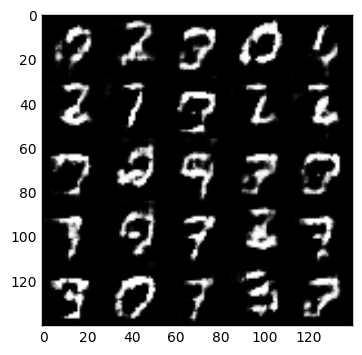

Epoch 1/2 Step710... Discriminator Loss: 0.5341... Generator Loss: 1.9535
Epoch 1/2 Step720... Discriminator Loss: 0.6006... Generator Loss: 1.3949
Epoch 1/2 Step730... Discriminator Loss: 0.4868... Generator Loss: 1.4068
Epoch 1/2 Step740... Discriminator Loss: 0.5186... Generator Loss: 1.9336
Epoch 1/2 Step750... Discriminator Loss: 0.9212... Generator Loss: 0.9413
Epoch 1/2 Step760... Discriminator Loss: 0.7593... Generator Loss: 0.8991
Epoch 1/2 Step770... Discriminator Loss: 0.6970... Generator Loss: 1.0998
Epoch 1/2 Step780... Discriminator Loss: 0.6844... Generator Loss: 3.8452
Epoch 1/2 Step790... Discriminator Loss: 1.1455... Generator Loss: 3.4891
Epoch 1/2 Step800... Discriminator Loss: 0.5825... Generator Loss: 1.1132


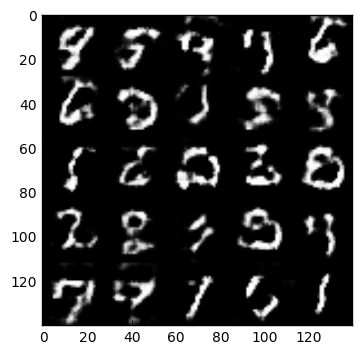

Epoch 1/2 Step810... Discriminator Loss: 0.6184... Generator Loss: 3.5242
Epoch 1/2 Step820... Discriminator Loss: 0.3623... Generator Loss: 2.1592
Epoch 1/2 Step830... Discriminator Loss: 0.8544... Generator Loss: 0.8816
Epoch 1/2 Step840... Discriminator Loss: 0.7647... Generator Loss: 1.1220
Epoch 1/2 Step850... Discriminator Loss: 0.3562... Generator Loss: 2.1139
Epoch 1/2 Step860... Discriminator Loss: 0.4386... Generator Loss: 1.8098
Epoch 1/2 Step870... Discriminator Loss: 0.7406... Generator Loss: 1.1063
Epoch 1/2 Step880... Discriminator Loss: 0.6984... Generator Loss: 0.9978
Epoch 1/2 Step890... Discriminator Loss: 1.2681... Generator Loss: 0.4403
Epoch 1/2 Step900... Discriminator Loss: 0.5906... Generator Loss: 1.2089


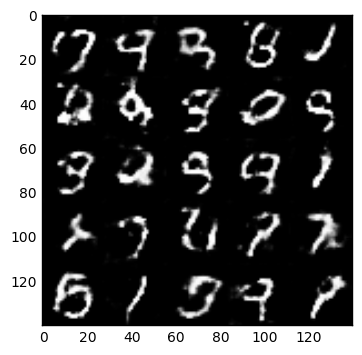

Epoch 1/2 Step910... Discriminator Loss: 1.0930... Generator Loss: 0.5390
Epoch 1/2 Step920... Discriminator Loss: 0.3845... Generator Loss: 1.9055
Epoch 1/2 Step930... Discriminator Loss: 0.6093... Generator Loss: 1.3124
Epoch 1/2 Step940... Discriminator Loss: 0.6036... Generator Loss: 1.2252
Epoch 1/2 Step950... Discriminator Loss: 0.4961... Generator Loss: 2.3601
Epoch 1/2 Step960... Discriminator Loss: 0.7517... Generator Loss: 2.4132
Epoch 1/2 Step970... Discriminator Loss: 1.0927... Generator Loss: 0.6108
Epoch 1/2 Step980... Discriminator Loss: 0.4003... Generator Loss: 1.6957
Epoch 1/2 Step990... Discriminator Loss: 0.5858... Generator Loss: 2.2104
Epoch 1/2 Step1000... Discriminator Loss: 0.2792... Generator Loss: 2.2313


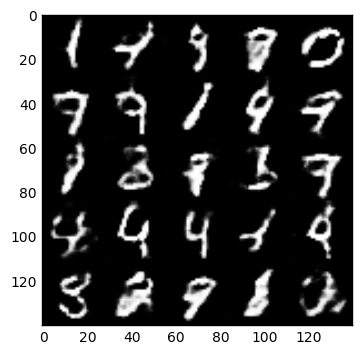

Epoch 1/2 Step1010... Discriminator Loss: 0.4163... Generator Loss: 1.7743
Epoch 1/2 Step1020... Discriminator Loss: 0.8122... Generator Loss: 0.7912
Epoch 1/2 Step1030... Discriminator Loss: 1.1473... Generator Loss: 0.5464
Epoch 1/2 Step1040... Discriminator Loss: 1.1920... Generator Loss: 0.5216
Epoch 1/2 Step1050... Discriminator Loss: 0.6849... Generator Loss: 0.9759
Epoch 1/2 Step1060... Discriminator Loss: 0.6630... Generator Loss: 1.0110
Epoch 1/2 Step1070... Discriminator Loss: 0.5065... Generator Loss: 1.6258
Epoch 1/2 Step1080... Discriminator Loss: 0.9034... Generator Loss: 0.6955
Epoch 1/2 Step1090... Discriminator Loss: 0.2400... Generator Loss: 2.8604
Epoch 1/2 Step1100... Discriminator Loss: 0.6243... Generator Loss: 1.2524


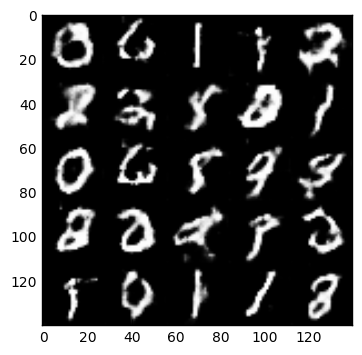

Epoch 1/2 Step1110... Discriminator Loss: 0.9753... Generator Loss: 0.7094
Epoch 1/2 Step1120... Discriminator Loss: 0.7125... Generator Loss: 0.9667
Epoch 1/2 Step1130... Discriminator Loss: 0.5051... Generator Loss: 1.5486
Epoch 1/2 Step1140... Discriminator Loss: 0.6354... Generator Loss: 1.6744
Epoch 1/2 Step1150... Discriminator Loss: 0.8271... Generator Loss: 1.0037
Epoch 1/2 Step1160... Discriminator Loss: 0.5896... Generator Loss: 1.0362
Epoch 1/2 Step1170... Discriminator Loss: 1.0321... Generator Loss: 0.5627
Epoch 1/2 Step1180... Discriminator Loss: 1.3315... Generator Loss: 0.4918
Epoch 1/2 Step1190... Discriminator Loss: 0.8995... Generator Loss: 0.7815
Epoch 1/2 Step1200... Discriminator Loss: 0.6171... Generator Loss: 1.3068


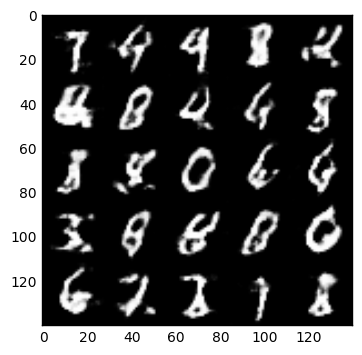

Epoch 1/2 Step1210... Discriminator Loss: 1.2422... Generator Loss: 0.4679
Epoch 1/2 Step1220... Discriminator Loss: 0.8291... Generator Loss: 0.8093
Epoch 1/2 Step1230... Discriminator Loss: 0.5739... Generator Loss: 1.8226
Epoch 1/2 Step1240... Discriminator Loss: 0.4854... Generator Loss: 1.4765
Epoch 1/2 Step1250... Discriminator Loss: 2.2624... Generator Loss: 0.1890
Epoch 1/2 Step1260... Discriminator Loss: 0.7240... Generator Loss: 1.8847
Epoch 1/2 Step1270... Discriminator Loss: 0.7777... Generator Loss: 0.8587
Epoch 1/2 Step1280... Discriminator Loss: 0.6766... Generator Loss: 1.0065
Epoch 1/2 Step1290... Discriminator Loss: 1.3025... Generator Loss: 0.4369
Epoch 1/2 Step1300... Discriminator Loss: 1.6554... Generator Loss: 3.0764


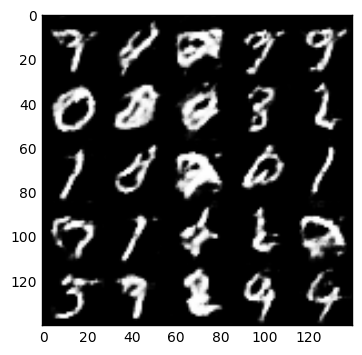

Epoch 1/2 Step1310... Discriminator Loss: 1.0859... Generator Loss: 0.6411
Epoch 1/2 Step1320... Discriminator Loss: 0.7536... Generator Loss: 3.2641
Epoch 1/2 Step1330... Discriminator Loss: 0.4317... Generator Loss: 1.7694
Epoch 1/2 Step1340... Discriminator Loss: 1.9032... Generator Loss: 0.2342
Epoch 1/2 Step1350... Discriminator Loss: 1.0597... Generator Loss: 0.6440
Epoch 1/2 Step1360... Discriminator Loss: 0.7236... Generator Loss: 1.5300
Epoch 1/2 Step1370... Discriminator Loss: 0.9316... Generator Loss: 0.7260
Epoch 1/2 Step1380... Discriminator Loss: 1.0735... Generator Loss: 0.6013
Epoch 1/2 Step1390... Discriminator Loss: 1.4383... Generator Loss: 0.3879
Epoch 1/2 Step1400... Discriminator Loss: 1.1066... Generator Loss: 0.5640


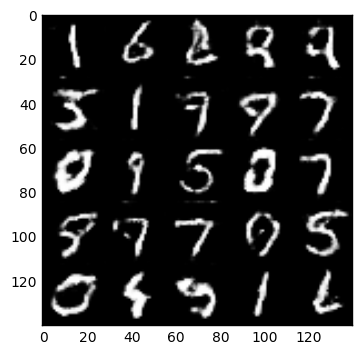

Epoch 1/2 Step1410... Discriminator Loss: 1.2876... Generator Loss: 0.4172
Epoch 1/2 Step1420... Discriminator Loss: 0.4438... Generator Loss: 1.3153
Epoch 1/2 Step1430... Discriminator Loss: 0.8737... Generator Loss: 1.3242
Epoch 1/2 Step1440... Discriminator Loss: 0.6773... Generator Loss: 1.3653
Epoch 1/2 Step1450... Discriminator Loss: 1.7633... Generator Loss: 0.2465
Epoch 1/2 Step1460... Discriminator Loss: 0.6681... Generator Loss: 0.9573
Epoch 1/2 Step1470... Discriminator Loss: 0.6994... Generator Loss: 2.6955
Epoch 1/2 Step1480... Discriminator Loss: 1.3455... Generator Loss: 0.6004
Epoch 1/2 Step1490... Discriminator Loss: 0.6172... Generator Loss: 1.3377
Epoch 1/2 Step1500... Discriminator Loss: 1.0505... Generator Loss: 0.7112


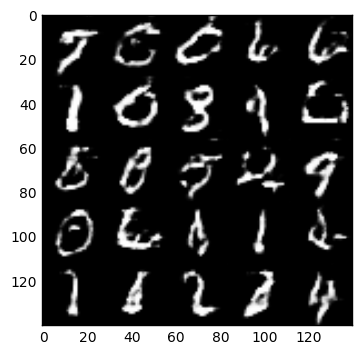

Epoch 1/2 Step1510... Discriminator Loss: 0.4439... Generator Loss: 1.3701
Epoch 1/2 Step1520... Discriminator Loss: 0.7717... Generator Loss: 0.7834
Epoch 1/2 Step1530... Discriminator Loss: 2.0498... Generator Loss: 0.1685
Epoch 1/2 Step1540... Discriminator Loss: 0.8883... Generator Loss: 0.7017
Epoch 1/2 Step1550... Discriminator Loss: 1.3671... Generator Loss: 0.5612
Epoch 1/2 Step1560... Discriminator Loss: 3.7272... Generator Loss: 6.5787
Epoch 1/2 Step1570... Discriminator Loss: 0.3685... Generator Loss: 1.8572
Epoch 1/2 Step1580... Discriminator Loss: 0.8553... Generator Loss: 0.8861
Epoch 1/2 Step1590... Discriminator Loss: 1.4011... Generator Loss: 0.4434
Epoch 1/2 Step1600... Discriminator Loss: 0.6857... Generator Loss: 1.0420


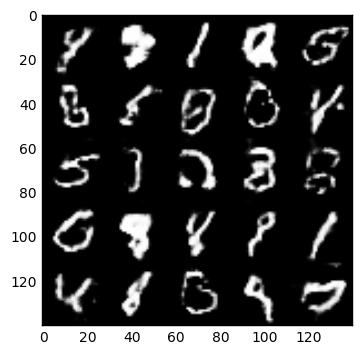

Epoch 1/2 Step1610... Discriminator Loss: 1.9986... Generator Loss: 0.2417
Epoch 1/2 Step1620... Discriminator Loss: 0.6393... Generator Loss: 0.9995
Epoch 1/2 Step1630... Discriminator Loss: 0.9361... Generator Loss: 0.6974
Epoch 1/2 Step1640... Discriminator Loss: 0.6731... Generator Loss: 1.0024
Epoch 1/2 Step1650... Discriminator Loss: 1.9077... Generator Loss: 0.2324
Epoch 1/2 Step1660... Discriminator Loss: 0.2958... Generator Loss: 1.7505
Epoch 1/2 Step1670... Discriminator Loss: 0.4898... Generator Loss: 1.4093
Epoch 1/2 Step1680... Discriminator Loss: 0.5920... Generator Loss: 1.1373
Epoch 1/2 Step1690... Discriminator Loss: 0.7313... Generator Loss: 1.1294
Epoch 1/2 Step1700... Discriminator Loss: 0.4158... Generator Loss: 3.1444


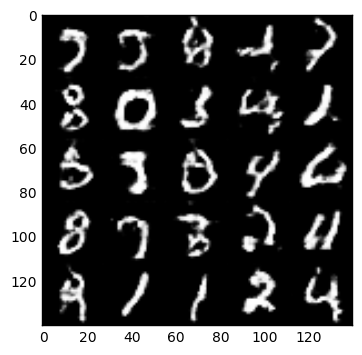

Epoch 1/2 Step1710... Discriminator Loss: 0.3827... Generator Loss: 1.8115
Epoch 1/2 Step1720... Discriminator Loss: 0.7300... Generator Loss: 0.8448
Epoch 1/2 Step1730... Discriminator Loss: 0.9139... Generator Loss: 0.7923
Epoch 1/2 Step1740... Discriminator Loss: 0.3188... Generator Loss: 2.1421
Epoch 1/2 Step1750... Discriminator Loss: 1.3140... Generator Loss: 0.4787
Epoch 1/2 Step1760... Discriminator Loss: 0.3543... Generator Loss: 2.2257
Epoch 1/2 Step1770... Discriminator Loss: 0.4306... Generator Loss: 1.8876
Epoch 1/2 Step1780... Discriminator Loss: 1.4238... Generator Loss: 0.3495
Epoch 1/2 Step1790... Discriminator Loss: 0.5089... Generator Loss: 2.9623
Epoch 1/2 Step1800... Discriminator Loss: 0.8776... Generator Loss: 0.7839


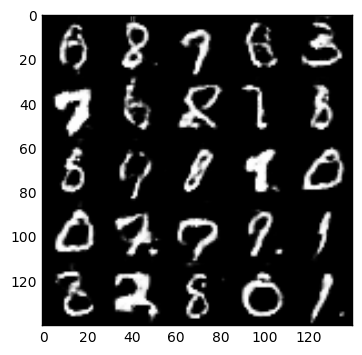

Epoch 1/2 Step1810... Discriminator Loss: 2.4794... Generator Loss: 0.1374
Epoch 1/2 Step1820... Discriminator Loss: 2.0261... Generator Loss: 0.2218
Epoch 1/2 Step1830... Discriminator Loss: 1.3181... Generator Loss: 2.4036
Epoch 1/2 Step1840... Discriminator Loss: 0.5021... Generator Loss: 1.2379
Epoch 1/2 Step1850... Discriminator Loss: 1.5090... Generator Loss: 0.3721
Epoch 1/2 Step1860... Discriminator Loss: 0.7667... Generator Loss: 3.1821
Epoch 1/2 Step1870... Discriminator Loss: 0.4181... Generator Loss: 1.3569
Epoch 2/2 Step1880... Discriminator Loss: 0.3823... Generator Loss: 1.9953
Epoch 2/2 Step1890... Discriminator Loss: 1.3164... Generator Loss: 0.5491
Epoch 2/2 Step1900... Discriminator Loss: 1.2140... Generator Loss: 0.4496


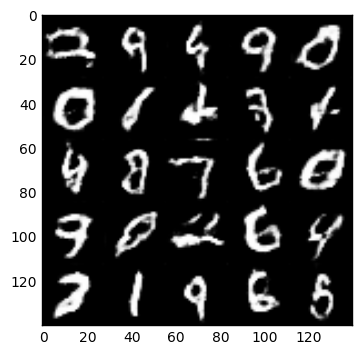

Epoch 2/2 Step1910... Discriminator Loss: 0.4826... Generator Loss: 1.1809
Epoch 2/2 Step1920... Discriminator Loss: 0.5718... Generator Loss: 1.2369
Epoch 2/2 Step1930... Discriminator Loss: 0.5141... Generator Loss: 1.6454
Epoch 2/2 Step1940... Discriminator Loss: 0.6621... Generator Loss: 1.0562
Epoch 2/2 Step1950... Discriminator Loss: 1.1654... Generator Loss: 4.9806
Epoch 2/2 Step1960... Discriminator Loss: 0.9231... Generator Loss: 2.0295
Epoch 2/2 Step1970... Discriminator Loss: 0.5300... Generator Loss: 1.1552
Epoch 2/2 Step1980... Discriminator Loss: 0.3242... Generator Loss: 1.6825
Epoch 2/2 Step1990... Discriminator Loss: 1.3421... Generator Loss: 0.3921
Epoch 2/2 Step2000... Discriminator Loss: 0.6537... Generator Loss: 1.0317


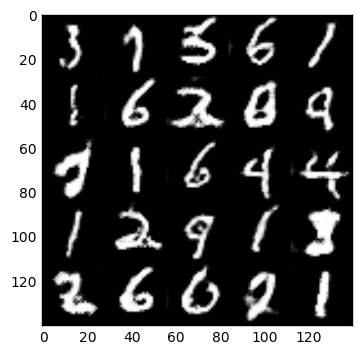

Epoch 2/2 Step2010... Discriminator Loss: 0.9716... Generator Loss: 0.6841
Epoch 2/2 Step2020... Discriminator Loss: 0.4759... Generator Loss: 1.2614
Epoch 2/2 Step2030... Discriminator Loss: 0.6656... Generator Loss: 0.9871
Epoch 2/2 Step2040... Discriminator Loss: 4.1077... Generator Loss: 0.0308
Epoch 2/2 Step2050... Discriminator Loss: 2.1858... Generator Loss: 0.1652
Epoch 2/2 Step2060... Discriminator Loss: 0.4020... Generator Loss: 1.5306
Epoch 2/2 Step2070... Discriminator Loss: 0.5602... Generator Loss: 1.1416
Epoch 2/2 Step2080... Discriminator Loss: 0.9545... Generator Loss: 0.5897
Epoch 2/2 Step2090... Discriminator Loss: 0.2258... Generator Loss: 4.0145
Epoch 2/2 Step2100... Discriminator Loss: 0.7262... Generator Loss: 1.0509


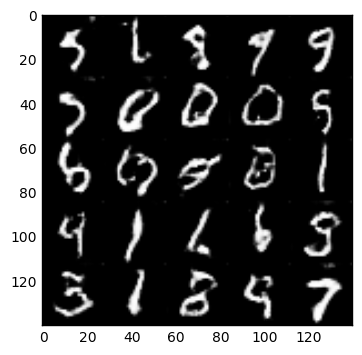

Epoch 2/2 Step2110... Discriminator Loss: 0.4281... Generator Loss: 1.3723
Epoch 2/2 Step2120... Discriminator Loss: 1.0057... Generator Loss: 0.6475
Epoch 2/2 Step2130... Discriminator Loss: 0.4985... Generator Loss: 1.2812
Epoch 2/2 Step2140... Discriminator Loss: 0.2245... Generator Loss: 2.3749
Epoch 2/2 Step2150... Discriminator Loss: 0.7862... Generator Loss: 0.7730
Epoch 2/2 Step2160... Discriminator Loss: 1.3666... Generator Loss: 0.4513
Epoch 2/2 Step2170... Discriminator Loss: 1.2141... Generator Loss: 0.5453
Epoch 2/2 Step2180... Discriminator Loss: 1.4075... Generator Loss: 0.3914
Epoch 2/2 Step2190... Discriminator Loss: 0.5532... Generator Loss: 1.4657
Epoch 2/2 Step2200... Discriminator Loss: 0.7361... Generator Loss: 0.9289


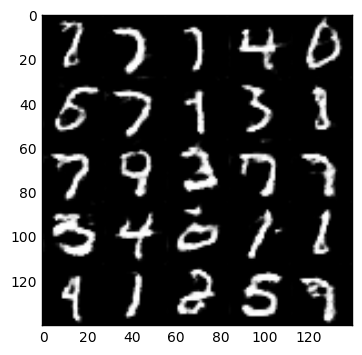

Epoch 2/2 Step2210... Discriminator Loss: 1.0575... Generator Loss: 0.7109
Epoch 2/2 Step2220... Discriminator Loss: 0.2964... Generator Loss: 4.2152
Epoch 2/2 Step2230... Discriminator Loss: 0.4427... Generator Loss: 1.5152
Epoch 2/2 Step2240... Discriminator Loss: 0.4501... Generator Loss: 1.3353
Epoch 2/2 Step2250... Discriminator Loss: 0.6663... Generator Loss: 0.9553
Epoch 2/2 Step2260... Discriminator Loss: 2.6061... Generator Loss: 0.1348
Epoch 2/2 Step2270... Discriminator Loss: 0.3878... Generator Loss: 1.6127
Epoch 2/2 Step2280... Discriminator Loss: 0.4445... Generator Loss: 1.5694
Epoch 2/2 Step2290... Discriminator Loss: 1.9358... Generator Loss: 0.2064
Epoch 2/2 Step2300... Discriminator Loss: 0.6351... Generator Loss: 1.0988


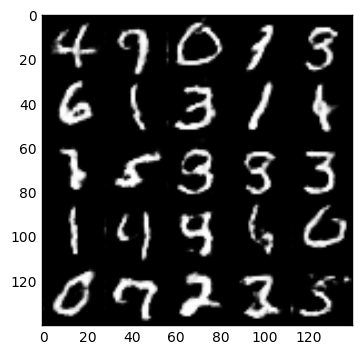

Epoch 2/2 Step2310... Discriminator Loss: 1.9235... Generator Loss: 0.2136
Epoch 2/2 Step2320... Discriminator Loss: 0.5665... Generator Loss: 1.0111
Epoch 2/2 Step2330... Discriminator Loss: 0.7462... Generator Loss: 0.8274
Epoch 2/2 Step2340... Discriminator Loss: 0.4506... Generator Loss: 1.7933
Epoch 2/2 Step2350... Discriminator Loss: 0.4869... Generator Loss: 1.1506
Epoch 2/2 Step2360... Discriminator Loss: 0.7815... Generator Loss: 0.8907
Epoch 2/2 Step2370... Discriminator Loss: 0.2418... Generator Loss: 2.0777
Epoch 2/2 Step2380... Discriminator Loss: 0.3655... Generator Loss: 1.7376
Epoch 2/2 Step2390... Discriminator Loss: 1.0794... Generator Loss: 0.5094
Epoch 2/2 Step2400... Discriminator Loss: 1.3407... Generator Loss: 0.5957


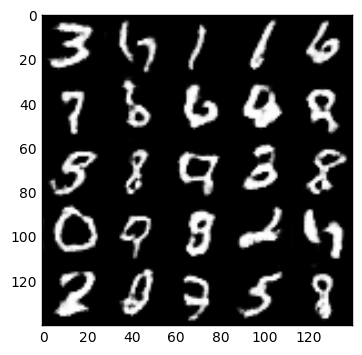

Epoch 2/2 Step2410... Discriminator Loss: 0.6890... Generator Loss: 0.8287
Epoch 2/2 Step2420... Discriminator Loss: 1.5684... Generator Loss: 0.3575
Epoch 2/2 Step2430... Discriminator Loss: 0.8534... Generator Loss: 0.9073
Epoch 2/2 Step2440... Discriminator Loss: 1.1184... Generator Loss: 0.5545
Epoch 2/2 Step2450... Discriminator Loss: 0.4742... Generator Loss: 1.3110
Epoch 2/2 Step2460... Discriminator Loss: 0.7838... Generator Loss: 0.7605
Epoch 2/2 Step2470... Discriminator Loss: 0.9405... Generator Loss: 0.6944
Epoch 2/2 Step2480... Discriminator Loss: 1.1370... Generator Loss: 0.5193
Epoch 2/2 Step2490... Discriminator Loss: 0.5868... Generator Loss: 0.9782
Epoch 2/2 Step2500... Discriminator Loss: 0.4462... Generator Loss: 1.9199


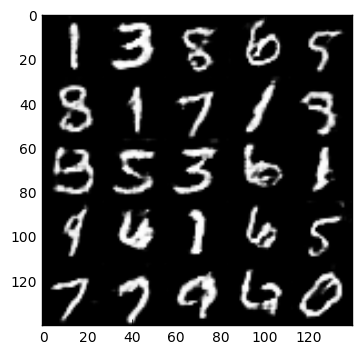

Epoch 2/2 Step2510... Discriminator Loss: 0.7572... Generator Loss: 0.9315
Epoch 2/2 Step2520... Discriminator Loss: 0.8947... Generator Loss: 0.6610
Epoch 2/2 Step2530... Discriminator Loss: 0.5832... Generator Loss: 1.0181
Epoch 2/2 Step2540... Discriminator Loss: 1.2033... Generator Loss: 0.4809
Epoch 2/2 Step2550... Discriminator Loss: 0.6821... Generator Loss: 1.1979
Epoch 2/2 Step2560... Discriminator Loss: 0.6980... Generator Loss: 0.8845
Epoch 2/2 Step2570... Discriminator Loss: 0.9330... Generator Loss: 0.6670
Epoch 2/2 Step2580... Discriminator Loss: 0.2005... Generator Loss: 3.1397
Epoch 2/2 Step2590... Discriminator Loss: 0.4678... Generator Loss: 2.8209
Epoch 2/2 Step2600... Discriminator Loss: 0.2141... Generator Loss: 2.0657


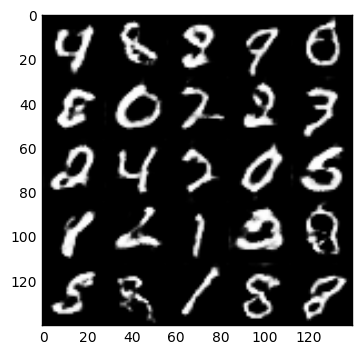

Epoch 2/2 Step2610... Discriminator Loss: 0.4318... Generator Loss: 1.3986
Epoch 2/2 Step2620... Discriminator Loss: 0.5830... Generator Loss: 1.2092
Epoch 2/2 Step2630... Discriminator Loss: 0.3626... Generator Loss: 3.4177
Epoch 2/2 Step2640... Discriminator Loss: 1.2469... Generator Loss: 4.5080
Epoch 2/2 Step2650... Discriminator Loss: 0.5687... Generator Loss: 2.0472
Epoch 2/2 Step2660... Discriminator Loss: 0.4570... Generator Loss: 1.3813
Epoch 2/2 Step2670... Discriminator Loss: 0.6487... Generator Loss: 0.9996
Epoch 2/2 Step2680... Discriminator Loss: 1.9982... Generator Loss: 0.2036
Epoch 2/2 Step2690... Discriminator Loss: 0.8565... Generator Loss: 0.7364
Epoch 2/2 Step2700... Discriminator Loss: 0.6640... Generator Loss: 0.8508


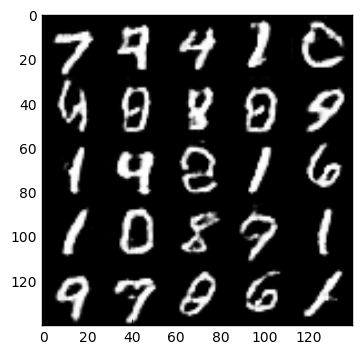

Epoch 2/2 Step2710... Discriminator Loss: 2.0725... Generator Loss: 0.2193
Epoch 2/2 Step2720... Discriminator Loss: 0.3134... Generator Loss: 1.9762
Epoch 2/2 Step2730... Discriminator Loss: 0.7869... Generator Loss: 0.8023
Epoch 2/2 Step2740... Discriminator Loss: 0.9325... Generator Loss: 0.7152
Epoch 2/2 Step2750... Discriminator Loss: 0.1156... Generator Loss: 2.7083
Epoch 2/2 Step2760... Discriminator Loss: 1.6798... Generator Loss: 0.2717
Epoch 2/2 Step2770... Discriminator Loss: 0.5014... Generator Loss: 1.2860
Epoch 2/2 Step2780... Discriminator Loss: 0.9275... Generator Loss: 0.8309
Epoch 2/2 Step2790... Discriminator Loss: 0.2451... Generator Loss: 2.3561
Epoch 2/2 Step2800... Discriminator Loss: 0.4660... Generator Loss: 1.2413


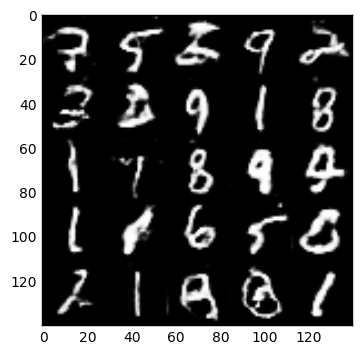

Epoch 2/2 Step2810... Discriminator Loss: 0.3113... Generator Loss: 1.8525
Epoch 2/2 Step2820... Discriminator Loss: 0.4296... Generator Loss: 1.4190
Epoch 2/2 Step2830... Discriminator Loss: 0.0825... Generator Loss: 3.7405
Epoch 2/2 Step2840... Discriminator Loss: 1.2333... Generator Loss: 0.4212
Epoch 2/2 Step2850... Discriminator Loss: 2.0390... Generator Loss: 0.2595
Epoch 2/2 Step2860... Discriminator Loss: 0.8033... Generator Loss: 0.8940
Epoch 2/2 Step2870... Discriminator Loss: 0.2195... Generator Loss: 3.1902
Epoch 2/2 Step2880... Discriminator Loss: 0.7132... Generator Loss: 0.8349
Epoch 2/2 Step2890... Discriminator Loss: 0.1078... Generator Loss: 3.4736
Epoch 2/2 Step2900... Discriminator Loss: 0.2746... Generator Loss: 1.9953


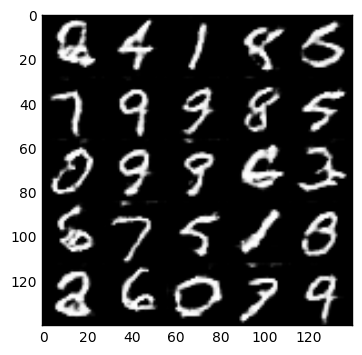

Epoch 2/2 Step2910... Discriminator Loss: 0.3675... Generator Loss: 1.5752
Epoch 2/2 Step2920... Discriminator Loss: 0.2365... Generator Loss: 3.3559
Epoch 2/2 Step2930... Discriminator Loss: 1.5059... Generator Loss: 0.3363
Epoch 2/2 Step2940... Discriminator Loss: 2.7703... Generator Loss: 0.1879
Epoch 2/2 Step2950... Discriminator Loss: 0.3040... Generator Loss: 1.7742
Epoch 2/2 Step2960... Discriminator Loss: 0.1258... Generator Loss: 2.8369
Epoch 2/2 Step2970... Discriminator Loss: 1.7728... Generator Loss: 0.3289
Epoch 2/2 Step2980... Discriminator Loss: 2.7457... Generator Loss: 0.1019
Epoch 2/2 Step2990... Discriminator Loss: 0.2016... Generator Loss: 2.8114
Epoch 2/2 Step3000... Discriminator Loss: 0.5160... Generator Loss: 1.2329


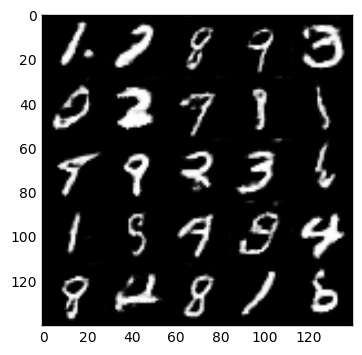

Epoch 2/2 Step3010... Discriminator Loss: 0.8051... Generator Loss: 0.6842
Epoch 2/2 Step3020... Discriminator Loss: 1.8410... Generator Loss: 0.2174
Epoch 2/2 Step3030... Discriminator Loss: 0.5803... Generator Loss: 1.3465
Epoch 2/2 Step3040... Discriminator Loss: 0.1885... Generator Loss: 3.0384
Epoch 2/2 Step3050... Discriminator Loss: 0.5691... Generator Loss: 1.0739
Epoch 2/2 Step3060... Discriminator Loss: 1.2257... Generator Loss: 0.4678
Epoch 2/2 Step3070... Discriminator Loss: 0.6725... Generator Loss: 0.8699
Epoch 2/2 Step3080... Discriminator Loss: 0.0835... Generator Loss: 3.0887
Epoch 2/2 Step3090... Discriminator Loss: 2.8829... Generator Loss: 0.0986
Epoch 2/2 Step3100... Discriminator Loss: 0.4496... Generator Loss: 1.4506


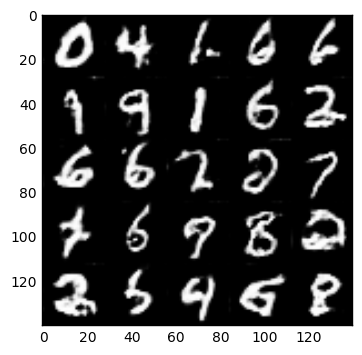

Epoch 2/2 Step3110... Discriminator Loss: 1.3292... Generator Loss: 0.4788
Epoch 2/2 Step3120... Discriminator Loss: 0.4912... Generator Loss: 1.4172
Epoch 2/2 Step3130... Discriminator Loss: 0.4040... Generator Loss: 1.3024
Epoch 2/2 Step3140... Discriminator Loss: 1.4491... Generator Loss: 0.4079
Epoch 2/2 Step3150... Discriminator Loss: 1.0160... Generator Loss: 0.6139
Epoch 2/2 Step3160... Discriminator Loss: 0.3957... Generator Loss: 1.4097
Epoch 2/2 Step3170... Discriminator Loss: 0.7004... Generator Loss: 0.9767
Epoch 2/2 Step3180... Discriminator Loss: 1.7437... Generator Loss: 0.3398
Epoch 2/2 Step3190... Discriminator Loss: 0.6173... Generator Loss: 1.0356
Epoch 2/2 Step3200... Discriminator Loss: 0.3202... Generator Loss: 1.4855


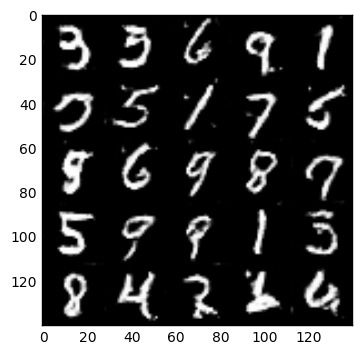

Epoch 2/2 Step3210... Discriminator Loss: 0.1197... Generator Loss: 3.1799
Epoch 2/2 Step3220... Discriminator Loss: 0.7096... Generator Loss: 1.0745
Epoch 2/2 Step3230... Discriminator Loss: 0.4880... Generator Loss: 1.2825
Epoch 2/2 Step3240... Discriminator Loss: 0.2974... Generator Loss: 1.9286
Epoch 2/2 Step3250... Discriminator Loss: 2.1459... Generator Loss: 0.2249
Epoch 2/2 Step3260... Discriminator Loss: 0.5179... Generator Loss: 1.3547
Epoch 2/2 Step3270... Discriminator Loss: 0.9136... Generator Loss: 0.6717
Epoch 2/2 Step3280... Discriminator Loss: 0.3222... Generator Loss: 1.8432
Epoch 2/2 Step3290... Discriminator Loss: 1.3253... Generator Loss: 0.6012
Epoch 2/2 Step3300... Discriminator Loss: 0.3627... Generator Loss: 2.8615


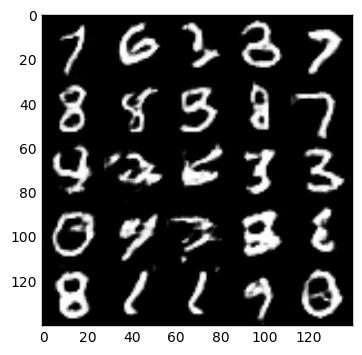

Epoch 2/2 Step3310... Discriminator Loss: 0.6256... Generator Loss: 1.1078
Epoch 2/2 Step3320... Discriminator Loss: 0.2987... Generator Loss: 1.8883
Epoch 2/2 Step3330... Discriminator Loss: 0.7981... Generator Loss: 0.8459
Epoch 2/2 Step3340... Discriminator Loss: 0.1461... Generator Loss: 5.0211
Epoch 2/2 Step3350... Discriminator Loss: 0.8257... Generator Loss: 0.8919
Epoch 2/2 Step3360... Discriminator Loss: 0.4788... Generator Loss: 1.7672
Epoch 2/2 Step3370... Discriminator Loss: 0.3257... Generator Loss: 1.8334
Epoch 2/2 Step3380... Discriminator Loss: 0.2113... Generator Loss: 2.2260
Epoch 2/2 Step3390... Discriminator Loss: 0.4119... Generator Loss: 1.3982
Epoch 2/2 Step3400... Discriminator Loss: 1.7577... Generator Loss: 6.0497


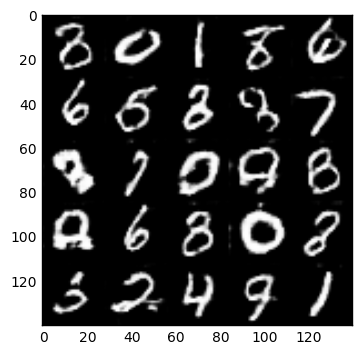

Epoch 2/2 Step3410... Discriminator Loss: 0.5564... Generator Loss: 1.0819
Epoch 2/2 Step3420... Discriminator Loss: 0.6843... Generator Loss: 0.9958
Epoch 2/2 Step3430... Discriminator Loss: 0.7838... Generator Loss: 0.9040
Epoch 2/2 Step3440... Discriminator Loss: 1.3083... Generator Loss: 0.4079
Epoch 2/2 Step3450... Discriminator Loss: 2.1453... Generator Loss: 0.2113
Epoch 2/2 Step3460... Discriminator Loss: 0.5851... Generator Loss: 1.3012
Epoch 2/2 Step3470... Discriminator Loss: 2.9113... Generator Loss: 0.1249
Epoch 2/2 Step3480... Discriminator Loss: 0.3770... Generator Loss: 4.5782
Epoch 2/2 Step3490... Discriminator Loss: 0.3677... Generator Loss: 1.5592
Epoch 2/2 Step3500... Discriminator Loss: 0.5736... Generator Loss: 1.0434


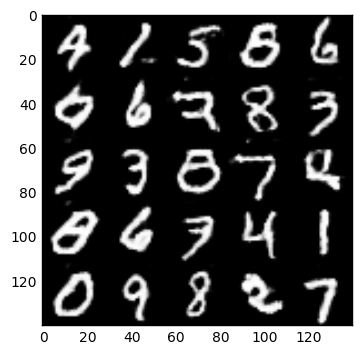

Epoch 2/2 Step3510... Discriminator Loss: 2.1471... Generator Loss: 6.6052
Epoch 2/2 Step3520... Discriminator Loss: 0.3538... Generator Loss: 1.6984
Epoch 2/2 Step3530... Discriminator Loss: 0.6420... Generator Loss: 1.1591
Epoch 2/2 Step3540... Discriminator Loss: 1.1080... Generator Loss: 0.6276
Epoch 2/2 Step3550... Discriminator Loss: 1.2078... Generator Loss: 0.5027
Epoch 2/2 Step3560... Discriminator Loss: 1.1631... Generator Loss: 0.7649
Epoch 2/2 Step3570... Discriminator Loss: 0.9684... Generator Loss: 1.5110
Epoch 2/2 Step3580... Discriminator Loss: 0.4567... Generator Loss: 1.5186
Epoch 2/2 Step3590... Discriminator Loss: 0.5646... Generator Loss: 7.2274
Epoch 2/2 Step3600... Discriminator Loss: 0.2496... Generator Loss: 2.5181


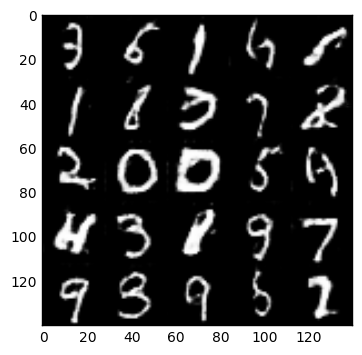

Epoch 2/2 Step3610... Discriminator Loss: 0.9838... Generator Loss: 0.7142
Epoch 2/2 Step3620... Discriminator Loss: 0.9570... Generator Loss: 0.6303
Epoch 2/2 Step3630... Discriminator Loss: 0.3074... Generator Loss: 2.3574
Epoch 2/2 Step3640... Discriminator Loss: 0.8528... Generator Loss: 3.6197
Epoch 2/2 Step3650... Discriminator Loss: 1.2934... Generator Loss: 0.4466
Epoch 2/2 Step3660... Discriminator Loss: 1.0700... Generator Loss: 0.5812
Epoch 2/2 Step3670... Discriminator Loss: 0.3817... Generator Loss: 1.5771
Epoch 2/2 Step3680... Discriminator Loss: 0.3215... Generator Loss: 2.3534
Epoch 2/2 Step3690... Discriminator Loss: 0.3055... Generator Loss: 2.5281
Epoch 2/2 Step3700... Discriminator Loss: 0.6386... Generator Loss: 1.0736


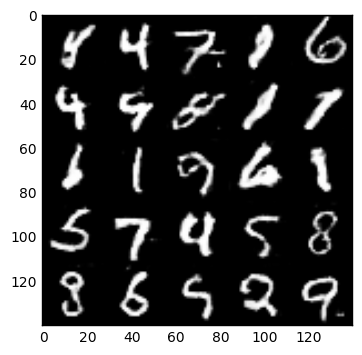

Epoch 2/2 Step3710... Discriminator Loss: 0.2198... Generator Loss: 1.9979
Epoch 2/2 Step3720... Discriminator Loss: 0.1996... Generator Loss: 2.3385
Epoch 2/2 Step3730... Discriminator Loss: 0.2755... Generator Loss: 2.0875
Epoch 2/2 Step3740... Discriminator Loss: 0.2561... Generator Loss: 2.6854
Epoch 2/2 Step3750... Discriminator Loss: 0.9037... Generator Loss: 0.6297


In [12]:
batch_size = 32
z_dim = 100
learning_rate = 0.0006
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1 Step10... Discriminator Loss: 5.8045... Generator Loss: 0.0033
Epoch 1/1 Step20... Discriminator Loss: 1.2605... Generator Loss: 0.3475
Epoch 1/1 Step30... Discriminator Loss: 0.6692... Generator Loss: 7.5812
Epoch 1/1 Step40... Discriminator Loss: 0.6939... Generator Loss: 6.4831
Epoch 1/1 Step50... Discriminator Loss: 0.2853... Generator Loss: 5.2863
Epoch 1/1 Step60... Discriminator Loss: 2.3799... Generator Loss: 0.2142
Epoch 1/1 Step70... Discriminator Loss: 0.7907... Generator Loss: 0.8650
Epoch 1/1 Step80... Discriminator Loss: 1.4748... Generator Loss: 0.6512
Epoch 1/1 Step90... Discriminator Loss: 1.4738... Generator Loss: 0.3697
Epoch 1/1 Step100... Discriminator Loss: 2.4859... Generator Loss: 5.8201


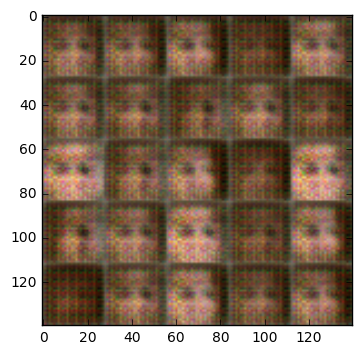

Epoch 1/1 Step110... Discriminator Loss: 1.0969... Generator Loss: 0.5559
Epoch 1/1 Step120... Discriminator Loss: 0.7408... Generator Loss: 3.4246
Epoch 1/1 Step130... Discriminator Loss: 1.5780... Generator Loss: 4.1447
Epoch 1/1 Step140... Discriminator Loss: 0.2082... Generator Loss: 2.7487
Epoch 1/1 Step150... Discriminator Loss: 0.3783... Generator Loss: 1.4969
Epoch 1/1 Step160... Discriminator Loss: 2.5866... Generator Loss: 0.2010
Epoch 1/1 Step170... Discriminator Loss: 1.1956... Generator Loss: 0.7048
Epoch 1/1 Step180... Discriminator Loss: 1.2623... Generator Loss: 0.6311
Epoch 1/1 Step190... Discriminator Loss: 2.2584... Generator Loss: 4.6971
Epoch 1/1 Step200... Discriminator Loss: 1.6404... Generator Loss: 0.6443


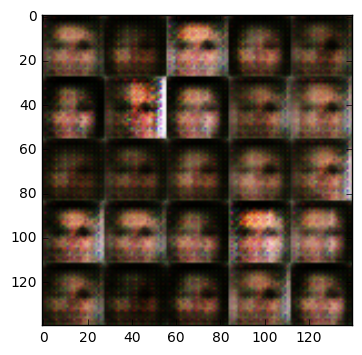

Epoch 1/1 Step210... Discriminator Loss: 0.8689... Generator Loss: 1.2157
Epoch 1/1 Step220... Discriminator Loss: 0.9207... Generator Loss: 1.4297
Epoch 1/1 Step230... Discriminator Loss: 1.2548... Generator Loss: 0.9103
Epoch 1/1 Step240... Discriminator Loss: 1.6642... Generator Loss: 0.3858
Epoch 1/1 Step250... Discriminator Loss: 1.8351... Generator Loss: 0.4268
Epoch 1/1 Step260... Discriminator Loss: 1.0719... Generator Loss: 1.7961
Epoch 1/1 Step270... Discriminator Loss: 1.0292... Generator Loss: 0.8680
Epoch 1/1 Step280... Discriminator Loss: 0.8549... Generator Loss: 1.0004
Epoch 1/1 Step290... Discriminator Loss: 0.7460... Generator Loss: 1.0909
Epoch 1/1 Step300... Discriminator Loss: 0.9568... Generator Loss: 0.8731


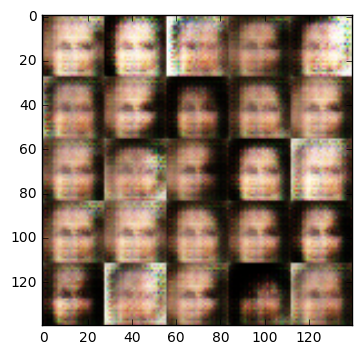

Epoch 1/1 Step310... Discriminator Loss: 1.0501... Generator Loss: 0.9770
Epoch 1/1 Step320... Discriminator Loss: 1.0373... Generator Loss: 1.0302
Epoch 1/1 Step330... Discriminator Loss: 0.3838... Generator Loss: 2.3512
Epoch 1/1 Step340... Discriminator Loss: 2.2725... Generator Loss: 0.2287
Epoch 1/1 Step350... Discriminator Loss: 0.8602... Generator Loss: 0.8466
Epoch 1/1 Step360... Discriminator Loss: 0.5262... Generator Loss: 1.7184
Epoch 1/1 Step370... Discriminator Loss: 0.6468... Generator Loss: 1.9685
Epoch 1/1 Step380... Discriminator Loss: 0.8186... Generator Loss: 0.8585
Epoch 1/1 Step390... Discriminator Loss: 1.0286... Generator Loss: 0.7968
Epoch 1/1 Step400... Discriminator Loss: 1.0783... Generator Loss: 0.5639


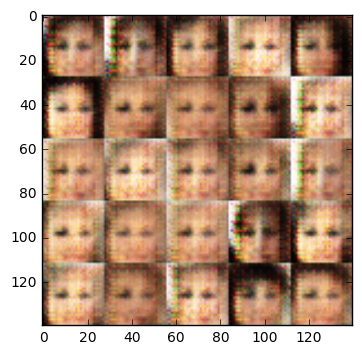

Epoch 1/1 Step410... Discriminator Loss: 0.3720... Generator Loss: 2.1074
Epoch 1/1 Step420... Discriminator Loss: 1.1236... Generator Loss: 0.9441
Epoch 1/1 Step430... Discriminator Loss: 1.2696... Generator Loss: 0.8131
Epoch 1/1 Step440... Discriminator Loss: 0.6746... Generator Loss: 1.1013
Epoch 1/1 Step450... Discriminator Loss: 0.6325... Generator Loss: 2.0757
Epoch 1/1 Step460... Discriminator Loss: 0.5073... Generator Loss: 1.6633
Epoch 1/1 Step470... Discriminator Loss: 0.6822... Generator Loss: 1.1733
Epoch 1/1 Step480... Discriminator Loss: 1.0169... Generator Loss: 0.8059
Epoch 1/1 Step490... Discriminator Loss: 1.9140... Generator Loss: 0.3153
Epoch 1/1 Step500... Discriminator Loss: 1.4909... Generator Loss: 0.4738


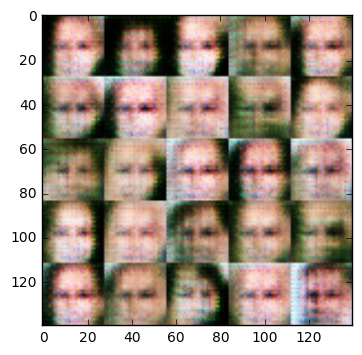

Epoch 1/1 Step510... Discriminator Loss: 1.2003... Generator Loss: 0.4858
Epoch 1/1 Step520... Discriminator Loss: 0.7586... Generator Loss: 0.8893
Epoch 1/1 Step530... Discriminator Loss: 1.0904... Generator Loss: 1.5793
Epoch 1/1 Step540... Discriminator Loss: 1.0989... Generator Loss: 0.7222
Epoch 1/1 Step550... Discriminator Loss: 1.2235... Generator Loss: 0.5949
Epoch 1/1 Step560... Discriminator Loss: 1.6857... Generator Loss: 0.4076
Epoch 1/1 Step570... Discriminator Loss: 0.7978... Generator Loss: 0.9007
Epoch 1/1 Step580... Discriminator Loss: 0.3049... Generator Loss: 2.2037
Epoch 1/1 Step590... Discriminator Loss: 0.6512... Generator Loss: 1.4102
Epoch 1/1 Step600... Discriminator Loss: 0.5389... Generator Loss: 1.7510


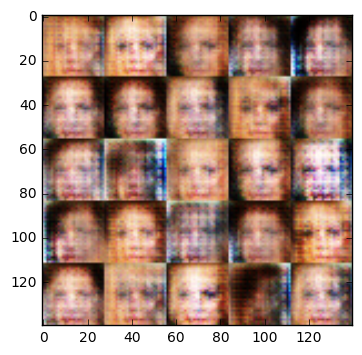

Epoch 1/1 Step610... Discriminator Loss: 0.8955... Generator Loss: 1.0482
Epoch 1/1 Step620... Discriminator Loss: 1.7676... Generator Loss: 0.3020
Epoch 1/1 Step630... Discriminator Loss: 0.4444... Generator Loss: 1.5491
Epoch 1/1 Step640... Discriminator Loss: 0.6058... Generator Loss: 1.3948
Epoch 1/1 Step650... Discriminator Loss: 0.5955... Generator Loss: 1.1924
Epoch 1/1 Step660... Discriminator Loss: 0.2871... Generator Loss: 2.4995
Epoch 1/1 Step670... Discriminator Loss: 0.7499... Generator Loss: 0.8184
Epoch 1/1 Step680... Discriminator Loss: 0.7709... Generator Loss: 2.0371
Epoch 1/1 Step690... Discriminator Loss: 0.8882... Generator Loss: 2.5892
Epoch 1/1 Step700... Discriminator Loss: 0.7006... Generator Loss: 0.9849


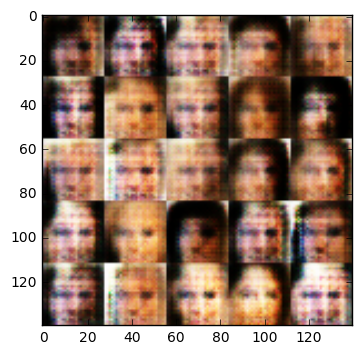

Epoch 1/1 Step710... Discriminator Loss: 0.5407... Generator Loss: 1.6988
Epoch 1/1 Step720... Discriminator Loss: 0.6772... Generator Loss: 1.0451
Epoch 1/1 Step730... Discriminator Loss: 0.8248... Generator Loss: 1.2394
Epoch 1/1 Step740... Discriminator Loss: 0.9191... Generator Loss: 0.8013
Epoch 1/1 Step750... Discriminator Loss: 0.6314... Generator Loss: 1.4838
Epoch 1/1 Step760... Discriminator Loss: 1.1744... Generator Loss: 3.8059
Epoch 1/1 Step770... Discriminator Loss: 0.6814... Generator Loss: 1.1212
Epoch 1/1 Step780... Discriminator Loss: 0.4978... Generator Loss: 1.7449
Epoch 1/1 Step790... Discriminator Loss: 0.4438... Generator Loss: 1.5546
Epoch 1/1 Step800... Discriminator Loss: 0.3036... Generator Loss: 2.1506


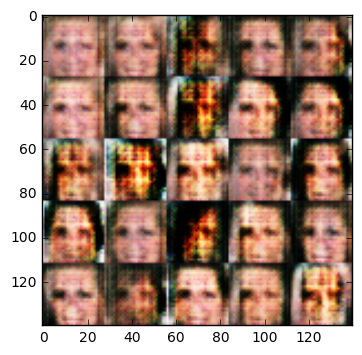

Epoch 1/1 Step810... Discriminator Loss: 2.6973... Generator Loss: 0.1091
Epoch 1/1 Step820... Discriminator Loss: 1.8154... Generator Loss: 0.2504
Epoch 1/1 Step830... Discriminator Loss: 0.4655... Generator Loss: 1.7995
Epoch 1/1 Step840... Discriminator Loss: 0.8224... Generator Loss: 3.0623
Epoch 1/1 Step850... Discriminator Loss: 0.9374... Generator Loss: 0.6908
Epoch 1/1 Step860... Discriminator Loss: 0.8660... Generator Loss: 1.0978
Epoch 1/1 Step870... Discriminator Loss: 0.6542... Generator Loss: 1.1760
Epoch 1/1 Step880... Discriminator Loss: 0.4972... Generator Loss: 2.4387
Epoch 1/1 Step890... Discriminator Loss: 0.4870... Generator Loss: 1.4934
Epoch 1/1 Step900... Discriminator Loss: 1.0044... Generator Loss: 0.6846


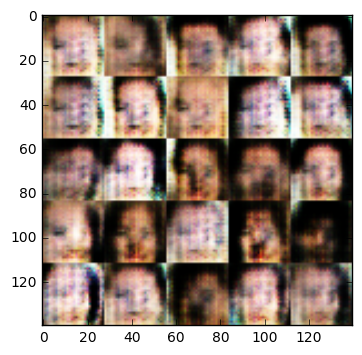

Epoch 1/1 Step910... Discriminator Loss: 1.2265... Generator Loss: 0.6369
Epoch 1/1 Step920... Discriminator Loss: 1.5541... Generator Loss: 0.3614
Epoch 1/1 Step930... Discriminator Loss: 0.5946... Generator Loss: 1.1951
Epoch 1/1 Step940... Discriminator Loss: 0.4837... Generator Loss: 1.6014
Epoch 1/1 Step950... Discriminator Loss: 1.3070... Generator Loss: 0.5302
Epoch 1/1 Step960... Discriminator Loss: 0.6135... Generator Loss: 1.1740
Epoch 1/1 Step970... Discriminator Loss: 0.5681... Generator Loss: 1.1768
Epoch 1/1 Step980... Discriminator Loss: 0.8035... Generator Loss: 2.2111
Epoch 1/1 Step990... Discriminator Loss: 0.8021... Generator Loss: 0.8842
Epoch 1/1 Step1000... Discriminator Loss: 1.3430... Generator Loss: 4.5245


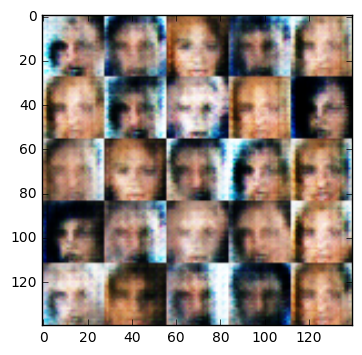

Epoch 1/1 Step1010... Discriminator Loss: 1.3395... Generator Loss: 0.5258
Epoch 1/1 Step1020... Discriminator Loss: 1.3598... Generator Loss: 0.4102
Epoch 1/1 Step1030... Discriminator Loss: 0.5839... Generator Loss: 1.0778
Epoch 1/1 Step1040... Discriminator Loss: 0.8473... Generator Loss: 1.0811
Epoch 1/1 Step1050... Discriminator Loss: 0.4190... Generator Loss: 2.0177
Epoch 1/1 Step1060... Discriminator Loss: 2.2167... Generator Loss: 0.1544
Epoch 1/1 Step1070... Discriminator Loss: 0.6796... Generator Loss: 1.3507
Epoch 1/1 Step1080... Discriminator Loss: 0.7419... Generator Loss: 3.2152
Epoch 1/1 Step1090... Discriminator Loss: 0.3868... Generator Loss: 1.9719
Epoch 1/1 Step1100... Discriminator Loss: 0.3562... Generator Loss: 2.0528


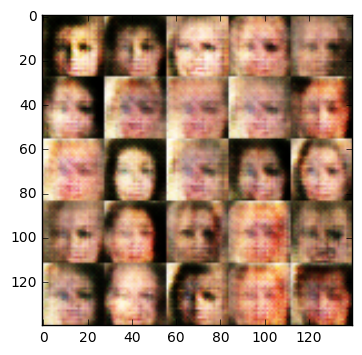

Epoch 1/1 Step1110... Discriminator Loss: 0.5820... Generator Loss: 1.1173
Epoch 1/1 Step1120... Discriminator Loss: 0.7909... Generator Loss: 1.0825
Epoch 1/1 Step1130... Discriminator Loss: 0.4719... Generator Loss: 1.7354
Epoch 1/1 Step1140... Discriminator Loss: 0.5361... Generator Loss: 1.2006
Epoch 1/1 Step1150... Discriminator Loss: 0.9648... Generator Loss: 0.6701
Epoch 1/1 Step1160... Discriminator Loss: 0.7745... Generator Loss: 1.1092
Epoch 1/1 Step1170... Discriminator Loss: 0.7692... Generator Loss: 0.8580
Epoch 1/1 Step1180... Discriminator Loss: 1.1891... Generator Loss: 0.5453
Epoch 1/1 Step1190... Discriminator Loss: 0.5588... Generator Loss: 1.8359
Epoch 1/1 Step1200... Discriminator Loss: 1.0053... Generator Loss: 0.5869


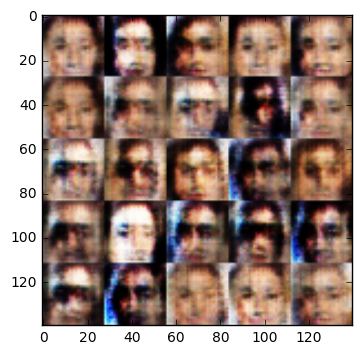

Epoch 1/1 Step1210... Discriminator Loss: 0.5777... Generator Loss: 2.2365
Epoch 1/1 Step1220... Discriminator Loss: 1.0843... Generator Loss: 0.6114
Epoch 1/1 Step1230... Discriminator Loss: 2.0018... Generator Loss: 6.2197
Epoch 1/1 Step1240... Discriminator Loss: 0.3811... Generator Loss: 2.6428
Epoch 1/1 Step1250... Discriminator Loss: 0.9628... Generator Loss: 0.6370
Epoch 1/1 Step1260... Discriminator Loss: 0.2977... Generator Loss: 1.9237
Epoch 1/1 Step1270... Discriminator Loss: 0.7816... Generator Loss: 0.8829
Epoch 1/1 Step1280... Discriminator Loss: 0.5618... Generator Loss: 1.6154
Epoch 1/1 Step1290... Discriminator Loss: 0.7119... Generator Loss: 0.8662
Epoch 1/1 Step1300... Discriminator Loss: 0.2798... Generator Loss: 2.8423


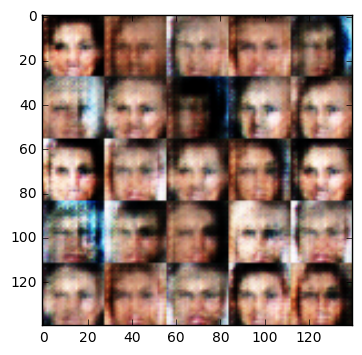

Epoch 1/1 Step1310... Discriminator Loss: 0.4563... Generator Loss: 1.4158
Epoch 1/1 Step1320... Discriminator Loss: 0.3721... Generator Loss: 2.1937
Epoch 1/1 Step1330... Discriminator Loss: 1.2780... Generator Loss: 0.5242
Epoch 1/1 Step1340... Discriminator Loss: 0.3715... Generator Loss: 1.6470
Epoch 1/1 Step1350... Discriminator Loss: 0.5030... Generator Loss: 1.4700
Epoch 1/1 Step1360... Discriminator Loss: 0.4972... Generator Loss: 2.1665
Epoch 1/1 Step1370... Discriminator Loss: 0.7839... Generator Loss: 0.8576
Epoch 1/1 Step1380... Discriminator Loss: 0.3548... Generator Loss: 3.0675
Epoch 1/1 Step1390... Discriminator Loss: 0.8997... Generator Loss: 0.6924
Epoch 1/1 Step1400... Discriminator Loss: 0.3740... Generator Loss: 1.9069


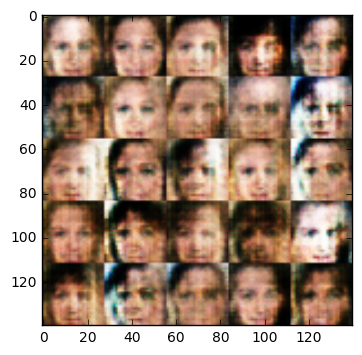

Epoch 1/1 Step1410... Discriminator Loss: 0.7283... Generator Loss: 1.1698
Epoch 1/1 Step1420... Discriminator Loss: 1.1089... Generator Loss: 0.4995
Epoch 1/1 Step1430... Discriminator Loss: 0.4553... Generator Loss: 2.8548
Epoch 1/1 Step1440... Discriminator Loss: 0.2882... Generator Loss: 2.1780
Epoch 1/1 Step1450... Discriminator Loss: 1.5058... Generator Loss: 0.4654
Epoch 1/1 Step1460... Discriminator Loss: 0.3163... Generator Loss: 1.6525
Epoch 1/1 Step1470... Discriminator Loss: 0.8840... Generator Loss: 4.8888
Epoch 1/1 Step1480... Discriminator Loss: 0.3412... Generator Loss: 1.6022
Epoch 1/1 Step1490... Discriminator Loss: 0.2260... Generator Loss: 2.8738
Epoch 1/1 Step1500... Discriminator Loss: 0.7244... Generator Loss: 1.0317


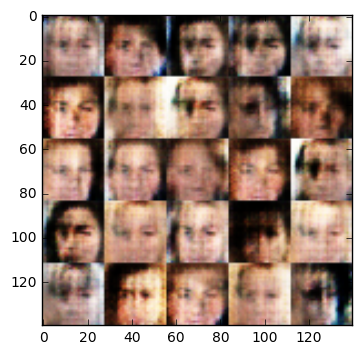

Epoch 1/1 Step1510... Discriminator Loss: 0.4232... Generator Loss: 2.2307
Epoch 1/1 Step1520... Discriminator Loss: 0.5655... Generator Loss: 3.5307
Epoch 1/1 Step1530... Discriminator Loss: 0.8773... Generator Loss: 0.9115
Epoch 1/1 Step1540... Discriminator Loss: 0.7229... Generator Loss: 2.8064
Epoch 1/1 Step1550... Discriminator Loss: 0.6700... Generator Loss: 0.9969
Epoch 1/1 Step1560... Discriminator Loss: 0.5249... Generator Loss: 2.5482
Epoch 1/1 Step1570... Discriminator Loss: 0.8169... Generator Loss: 0.9020
Epoch 1/1 Step1580... Discriminator Loss: 0.8920... Generator Loss: 0.8000
Epoch 1/1 Step1590... Discriminator Loss: 0.5285... Generator Loss: 3.2226
Epoch 1/1 Step1600... Discriminator Loss: 0.9541... Generator Loss: 0.7103


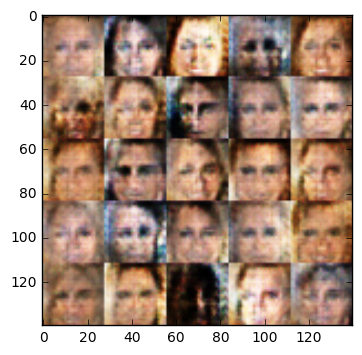

Epoch 1/1 Step1610... Discriminator Loss: 0.6657... Generator Loss: 1.0433
Epoch 1/1 Step1620... Discriminator Loss: 0.5689... Generator Loss: 1.4013
Epoch 1/1 Step1630... Discriminator Loss: 0.5429... Generator Loss: 2.6182
Epoch 1/1 Step1640... Discriminator Loss: 0.8985... Generator Loss: 0.7258
Epoch 1/1 Step1650... Discriminator Loss: 0.8600... Generator Loss: 1.3013
Epoch 1/1 Step1660... Discriminator Loss: 0.7120... Generator Loss: 0.9199
Epoch 1/1 Step1670... Discriminator Loss: 0.6038... Generator Loss: 1.0731
Epoch 1/1 Step1680... Discriminator Loss: 1.3913... Generator Loss: 0.3897
Epoch 1/1 Step1690... Discriminator Loss: 0.4251... Generator Loss: 1.7123
Epoch 1/1 Step1700... Discriminator Loss: 0.4799... Generator Loss: 2.5703


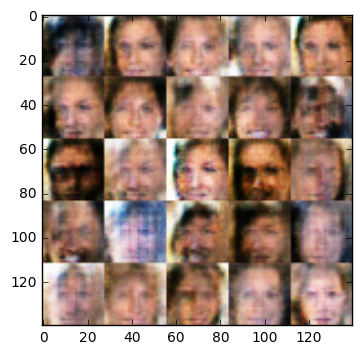

Epoch 1/1 Step1710... Discriminator Loss: 1.2424... Generator Loss: 0.5505
Epoch 1/1 Step1720... Discriminator Loss: 0.4292... Generator Loss: 2.1644
Epoch 1/1 Step1730... Discriminator Loss: 0.6130... Generator Loss: 1.0320
Epoch 1/1 Step1740... Discriminator Loss: 0.4184... Generator Loss: 1.7821
Epoch 1/1 Step1750... Discriminator Loss: 0.7348... Generator Loss: 0.8787
Epoch 1/1 Step1760... Discriminator Loss: 0.6061... Generator Loss: 1.6324
Epoch 1/1 Step1770... Discriminator Loss: 0.6581... Generator Loss: 5.1433
Epoch 1/1 Step1780... Discriminator Loss: 0.5172... Generator Loss: 1.6318
Epoch 1/1 Step1790... Discriminator Loss: 0.8347... Generator Loss: 4.2450
Epoch 1/1 Step1800... Discriminator Loss: 0.5199... Generator Loss: 1.5315


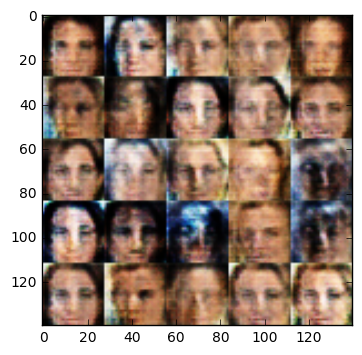

Epoch 1/1 Step1810... Discriminator Loss: 0.8144... Generator Loss: 0.9145
Epoch 1/1 Step1820... Discriminator Loss: 0.9019... Generator Loss: 0.7328
Epoch 1/1 Step1830... Discriminator Loss: 0.5652... Generator Loss: 1.3317
Epoch 1/1 Step1840... Discriminator Loss: 0.5712... Generator Loss: 1.1301
Epoch 1/1 Step1850... Discriminator Loss: 0.4404... Generator Loss: 1.8396
Epoch 1/1 Step1860... Discriminator Loss: 1.0160... Generator Loss: 3.8404
Epoch 1/1 Step1870... Discriminator Loss: 0.6542... Generator Loss: 0.9038
Epoch 1/1 Step1880... Discriminator Loss: 2.0431... Generator Loss: 0.2826
Epoch 1/1 Step1890... Discriminator Loss: 0.6011... Generator Loss: 1.3215
Epoch 1/1 Step1900... Discriminator Loss: 0.4267... Generator Loss: 1.7214


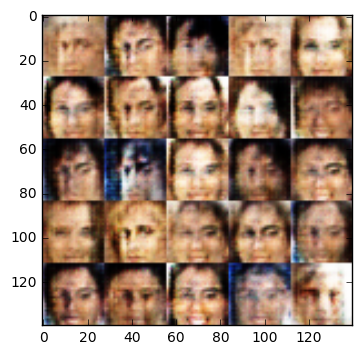

Epoch 1/1 Step1910... Discriminator Loss: 1.0163... Generator Loss: 0.5580
Epoch 1/1 Step1920... Discriminator Loss: 0.5116... Generator Loss: 1.7027
Epoch 1/1 Step1930... Discriminator Loss: 1.5453... Generator Loss: 0.2863
Epoch 1/1 Step1940... Discriminator Loss: 1.3074... Generator Loss: 0.4363
Epoch 1/1 Step1950... Discriminator Loss: 0.4285... Generator Loss: 1.9305
Epoch 1/1 Step1960... Discriminator Loss: 0.5373... Generator Loss: 2.6477
Epoch 1/1 Step1970... Discriminator Loss: 1.9483... Generator Loss: 5.9742
Epoch 1/1 Step1980... Discriminator Loss: 0.4659... Generator Loss: 1.6637
Epoch 1/1 Step1990... Discriminator Loss: 0.6409... Generator Loss: 1.1082
Epoch 1/1 Step2000... Discriminator Loss: 0.3755... Generator Loss: 1.5901


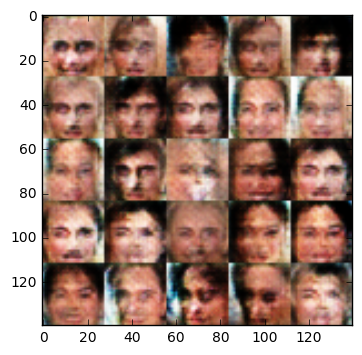

Epoch 1/1 Step2010... Discriminator Loss: 0.6329... Generator Loss: 0.9706
Epoch 1/1 Step2020... Discriminator Loss: 0.5380... Generator Loss: 1.5141
Epoch 1/1 Step2030... Discriminator Loss: 0.9287... Generator Loss: 0.8365
Epoch 1/1 Step2040... Discriminator Loss: 0.4137... Generator Loss: 1.8607
Epoch 1/1 Step2050... Discriminator Loss: 0.6427... Generator Loss: 1.1270
Epoch 1/1 Step2060... Discriminator Loss: 0.6622... Generator Loss: 1.1369
Epoch 1/1 Step2070... Discriminator Loss: 0.4087... Generator Loss: 2.7246
Epoch 1/1 Step2080... Discriminator Loss: 0.3818... Generator Loss: 1.6768
Epoch 1/1 Step2090... Discriminator Loss: 0.7786... Generator Loss: 0.8828
Epoch 1/1 Step2100... Discriminator Loss: 0.6373... Generator Loss: 1.6226


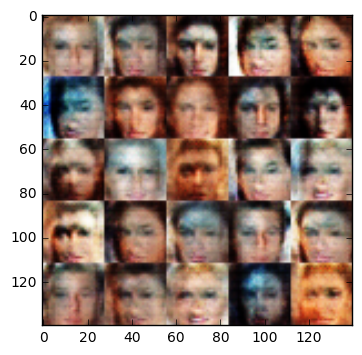

Epoch 1/1 Step2110... Discriminator Loss: 0.6718... Generator Loss: 2.8608
Epoch 1/1 Step2120... Discriminator Loss: 1.5395... Generator Loss: 0.4516
Epoch 1/1 Step2130... Discriminator Loss: 0.4765... Generator Loss: 1.3124
Epoch 1/1 Step2140... Discriminator Loss: 0.8185... Generator Loss: 0.8147
Epoch 1/1 Step2150... Discriminator Loss: 0.8324... Generator Loss: 0.8313
Epoch 1/1 Step2160... Discriminator Loss: 0.5974... Generator Loss: 1.3109
Epoch 1/1 Step2170... Discriminator Loss: 0.8729... Generator Loss: 0.8323
Epoch 1/1 Step2180... Discriminator Loss: 0.4779... Generator Loss: 1.5054
Epoch 1/1 Step2190... Discriminator Loss: 0.5740... Generator Loss: 2.2526
Epoch 1/1 Step2200... Discriminator Loss: 0.7715... Generator Loss: 0.9009


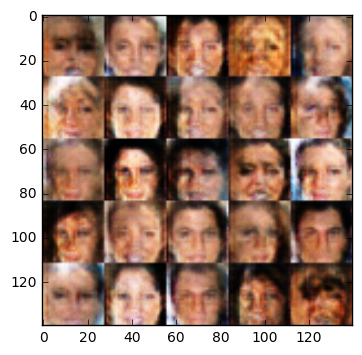

Epoch 1/1 Step2210... Discriminator Loss: 1.3538... Generator Loss: 0.4146
Epoch 1/1 Step2220... Discriminator Loss: 0.6737... Generator Loss: 0.9608
Epoch 1/1 Step2230... Discriminator Loss: 0.6653... Generator Loss: 1.1460
Epoch 1/1 Step2240... Discriminator Loss: 0.5627... Generator Loss: 1.2370
Epoch 1/1 Step2250... Discriminator Loss: 0.7126... Generator Loss: 0.9795
Epoch 1/1 Step2260... Discriminator Loss: 0.5231... Generator Loss: 1.5774
Epoch 1/1 Step2270... Discriminator Loss: 0.8501... Generator Loss: 0.7167
Epoch 1/1 Step2280... Discriminator Loss: 0.4528... Generator Loss: 1.5972
Epoch 1/1 Step2290... Discriminator Loss: 0.4187... Generator Loss: 1.7360
Epoch 1/1 Step2300... Discriminator Loss: 0.1951... Generator Loss: 4.0918


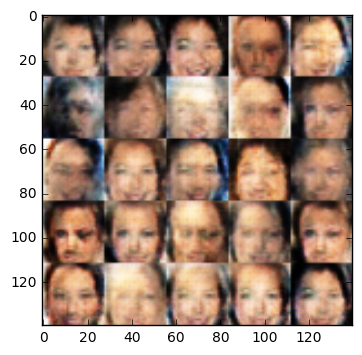

Epoch 1/1 Step2310... Discriminator Loss: 0.8572... Generator Loss: 0.7195
Epoch 1/1 Step2320... Discriminator Loss: 1.9525... Generator Loss: 6.0153
Epoch 1/1 Step2330... Discriminator Loss: 0.7337... Generator Loss: 3.7965
Epoch 1/1 Step2340... Discriminator Loss: 0.3479... Generator Loss: 2.2004
Epoch 1/1 Step2350... Discriminator Loss: 0.5637... Generator Loss: 1.4346
Epoch 1/1 Step2360... Discriminator Loss: 0.5219... Generator Loss: 1.3774
Epoch 1/1 Step2370... Discriminator Loss: 0.7549... Generator Loss: 1.0946
Epoch 1/1 Step2380... Discriminator Loss: 0.2787... Generator Loss: 2.0473
Epoch 1/1 Step2390... Discriminator Loss: 1.1997... Generator Loss: 0.5069
Epoch 1/1 Step2400... Discriminator Loss: 0.5146... Generator Loss: 1.4017


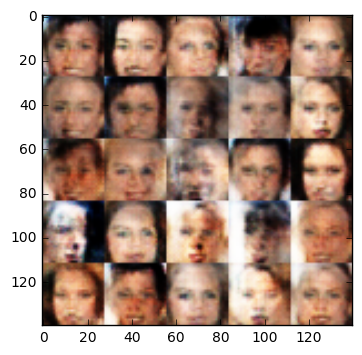

Epoch 1/1 Step2410... Discriminator Loss: 1.5390... Generator Loss: 0.3126
Epoch 1/1 Step2420... Discriminator Loss: 1.0059... Generator Loss: 4.3421
Epoch 1/1 Step2430... Discriminator Loss: 1.0660... Generator Loss: 0.6888
Epoch 1/1 Step2440... Discriminator Loss: 0.5767... Generator Loss: 1.1671
Epoch 1/1 Step2450... Discriminator Loss: 0.6260... Generator Loss: 1.1070
Epoch 1/1 Step2460... Discriminator Loss: 0.7815... Generator Loss: 2.5380
Epoch 1/1 Step2470... Discriminator Loss: 0.5095... Generator Loss: 1.1756
Epoch 1/1 Step2480... Discriminator Loss: 0.3548... Generator Loss: 1.8185
Epoch 1/1 Step2490... Discriminator Loss: 0.4506... Generator Loss: 1.4296
Epoch 1/1 Step2500... Discriminator Loss: 0.3283... Generator Loss: 1.9740


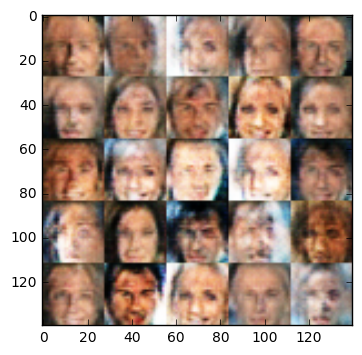

Epoch 1/1 Step2510... Discriminator Loss: 0.7436... Generator Loss: 5.3082
Epoch 1/1 Step2520... Discriminator Loss: 0.4348... Generator Loss: 1.9165
Epoch 1/1 Step2530... Discriminator Loss: 0.5792... Generator Loss: 3.7683
Epoch 1/1 Step2540... Discriminator Loss: 0.4148... Generator Loss: 1.8105
Epoch 1/1 Step2550... Discriminator Loss: 0.7242... Generator Loss: 1.1331
Epoch 1/1 Step2560... Discriminator Loss: 0.7207... Generator Loss: 0.8366
Epoch 1/1 Step2570... Discriminator Loss: 0.7386... Generator Loss: 0.8542
Epoch 1/1 Step2580... Discriminator Loss: 0.4608... Generator Loss: 1.9767
Epoch 1/1 Step2590... Discriminator Loss: 0.6248... Generator Loss: 2.3574
Epoch 1/1 Step2600... Discriminator Loss: 0.7070... Generator Loss: 2.6904


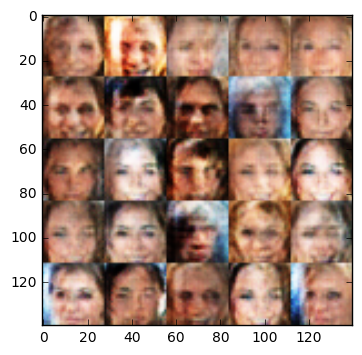

Epoch 1/1 Step2610... Discriminator Loss: 0.6167... Generator Loss: 3.5138
Epoch 1/1 Step2620... Discriminator Loss: 0.5246... Generator Loss: 2.6547
Epoch 1/1 Step2630... Discriminator Loss: 0.5765... Generator Loss: 1.1587
Epoch 1/1 Step2640... Discriminator Loss: 0.4594... Generator Loss: 2.1811
Epoch 1/1 Step2650... Discriminator Loss: 0.7587... Generator Loss: 0.9818
Epoch 1/1 Step2660... Discriminator Loss: 0.5707... Generator Loss: 1.3290
Epoch 1/1 Step2670... Discriminator Loss: 1.4272... Generator Loss: 5.4473
Epoch 1/1 Step2680... Discriminator Loss: 0.6726... Generator Loss: 0.9436
Epoch 1/1 Step2690... Discriminator Loss: 0.5081... Generator Loss: 1.3759
Epoch 1/1 Step2700... Discriminator Loss: 1.3132... Generator Loss: 0.4370


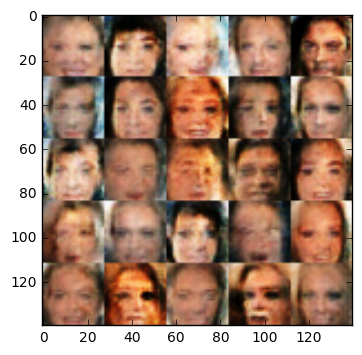

Epoch 1/1 Step2710... Discriminator Loss: 1.2352... Generator Loss: 0.5213
Epoch 1/1 Step2720... Discriminator Loss: 0.4537... Generator Loss: 2.6820
Epoch 1/1 Step2730... Discriminator Loss: 1.3651... Generator Loss: 0.4533
Epoch 1/1 Step2740... Discriminator Loss: 0.3265... Generator Loss: 1.7606
Epoch 1/1 Step2750... Discriminator Loss: 0.5274... Generator Loss: 1.3384
Epoch 1/1 Step2760... Discriminator Loss: 1.1529... Generator Loss: 0.4893
Epoch 1/1 Step2770... Discriminator Loss: 0.9520... Generator Loss: 0.7363
Epoch 1/1 Step2780... Discriminator Loss: 0.4053... Generator Loss: 1.4889
Epoch 1/1 Step2790... Discriminator Loss: 0.7817... Generator Loss: 4.4319
Epoch 1/1 Step2800... Discriminator Loss: 0.4856... Generator Loss: 2.1376


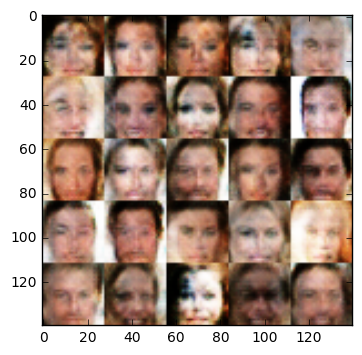

Epoch 1/1 Step2810... Discriminator Loss: 0.8699... Generator Loss: 0.8150
Epoch 1/1 Step2820... Discriminator Loss: 0.4866... Generator Loss: 1.5978
Epoch 1/1 Step2830... Discriminator Loss: 0.5913... Generator Loss: 1.2297
Epoch 1/1 Step2840... Discriminator Loss: 0.7761... Generator Loss: 0.9762
Epoch 1/1 Step2850... Discriminator Loss: 0.3535... Generator Loss: 2.1768
Epoch 1/1 Step2860... Discriminator Loss: 1.8130... Generator Loss: 0.2384
Epoch 1/1 Step2870... Discriminator Loss: 1.2752... Generator Loss: 0.5179
Epoch 1/1 Step2880... Discriminator Loss: 1.4051... Generator Loss: 0.3657
Epoch 1/1 Step2890... Discriminator Loss: 0.4756... Generator Loss: 1.2415
Epoch 1/1 Step2900... Discriminator Loss: 0.4469... Generator Loss: 2.8340


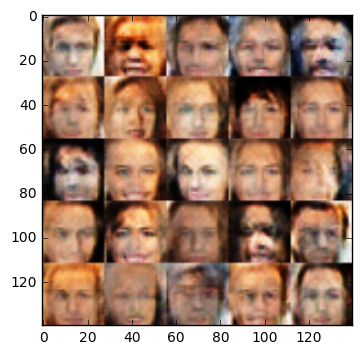

Epoch 1/1 Step2910... Discriminator Loss: 0.4111... Generator Loss: 1.9443
Epoch 1/1 Step2920... Discriminator Loss: 0.6177... Generator Loss: 1.1279
Epoch 1/1 Step2930... Discriminator Loss: 0.8613... Generator Loss: 0.7435
Epoch 1/1 Step2940... Discriminator Loss: 0.5863... Generator Loss: 1.2363
Epoch 1/1 Step2950... Discriminator Loss: 0.5348... Generator Loss: 1.6168
Epoch 1/1 Step2960... Discriminator Loss: 0.4861... Generator Loss: 2.5946
Epoch 1/1 Step2970... Discriminator Loss: 0.6243... Generator Loss: 1.0041
Epoch 1/1 Step2980... Discriminator Loss: 0.7775... Generator Loss: 1.1806
Epoch 1/1 Step2990... Discriminator Loss: 0.6355... Generator Loss: 1.3376
Epoch 1/1 Step3000... Discriminator Loss: 0.7626... Generator Loss: 0.9156


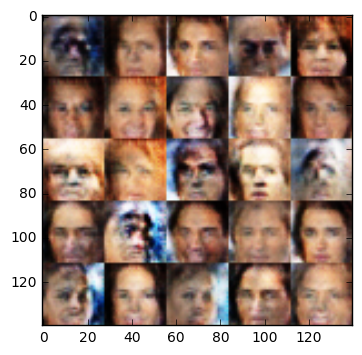

Epoch 1/1 Step3010... Discriminator Loss: 0.8108... Generator Loss: 0.7914
Epoch 1/1 Step3020... Discriminator Loss: 0.4332... Generator Loss: 1.5060
Epoch 1/1 Step3030... Discriminator Loss: 0.6684... Generator Loss: 3.7425
Epoch 1/1 Step3040... Discriminator Loss: 0.7073... Generator Loss: 1.0091
Epoch 1/1 Step3050... Discriminator Loss: 0.6259... Generator Loss: 1.0432
Epoch 1/1 Step3060... Discriminator Loss: 0.4075... Generator Loss: 2.1638
Epoch 1/1 Step3070... Discriminator Loss: 0.5353... Generator Loss: 3.0142
Epoch 1/1 Step3080... Discriminator Loss: 0.6406... Generator Loss: 1.1013
Epoch 1/1 Step3090... Discriminator Loss: 1.2796... Generator Loss: 0.4854
Epoch 1/1 Step3100... Discriminator Loss: 1.0319... Generator Loss: 0.5700


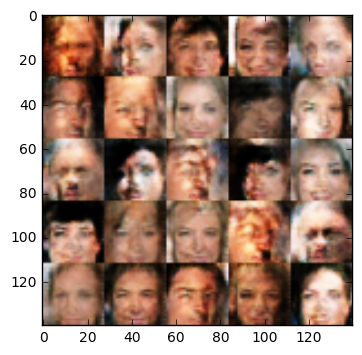

Epoch 1/1 Step3110... Discriminator Loss: 0.3917... Generator Loss: 2.0329
Epoch 1/1 Step3120... Discriminator Loss: 2.6156... Generator Loss: 7.1952
Epoch 1/1 Step3130... Discriminator Loss: 1.3706... Generator Loss: 4.3397
Epoch 1/1 Step3140... Discriminator Loss: 0.4285... Generator Loss: 1.6973
Epoch 1/1 Step3150... Discriminator Loss: 0.5149... Generator Loss: 1.2872
Epoch 1/1 Step3160... Discriminator Loss: 0.3904... Generator Loss: 1.5587
Epoch 1/1 Step3170... Discriminator Loss: 1.0795... Generator Loss: 0.5892
Epoch 1/1 Step3180... Discriminator Loss: 0.5108... Generator Loss: 1.5002
Epoch 1/1 Step3190... Discriminator Loss: 0.6989... Generator Loss: 3.2556
Epoch 1/1 Step3200... Discriminator Loss: 0.8104... Generator Loss: 5.1710


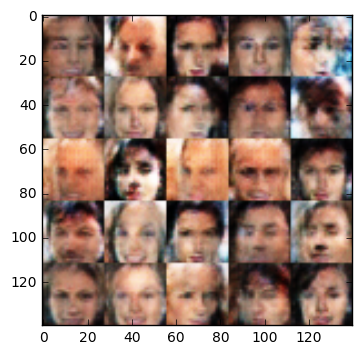

Epoch 1/1 Step3210... Discriminator Loss: 0.6772... Generator Loss: 0.8893
Epoch 1/1 Step3220... Discriminator Loss: 0.5585... Generator Loss: 1.2570
Epoch 1/1 Step3230... Discriminator Loss: 0.4428... Generator Loss: 1.4848
Epoch 1/1 Step3240... Discriminator Loss: 0.3244... Generator Loss: 2.0949
Epoch 1/1 Step3250... Discriminator Loss: 0.5496... Generator Loss: 1.3651
Epoch 1/1 Step3260... Discriminator Loss: 0.7838... Generator Loss: 2.5554
Epoch 1/1 Step3270... Discriminator Loss: 0.4368... Generator Loss: 1.7218
Epoch 1/1 Step3280... Discriminator Loss: 0.5563... Generator Loss: 2.8488
Epoch 1/1 Step3290... Discriminator Loss: 0.8483... Generator Loss: 0.8444
Epoch 1/1 Step3300... Discriminator Loss: 0.4511... Generator Loss: 1.4859


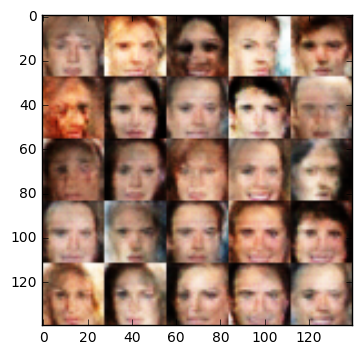

Epoch 1/1 Step3310... Discriminator Loss: 0.6146... Generator Loss: 1.0475
Epoch 1/1 Step3320... Discriminator Loss: 1.1213... Generator Loss: 0.4949
Epoch 1/1 Step3330... Discriminator Loss: 0.7907... Generator Loss: 0.8395
Epoch 1/1 Step3340... Discriminator Loss: 0.3737... Generator Loss: 1.6659
Epoch 1/1 Step3350... Discriminator Loss: 1.8346... Generator Loss: 0.2287
Epoch 1/1 Step3360... Discriminator Loss: 0.8121... Generator Loss: 0.7998
Epoch 1/1 Step3370... Discriminator Loss: 0.5218... Generator Loss: 1.5510
Epoch 1/1 Step3380... Discriminator Loss: 0.4210... Generator Loss: 1.4939
Epoch 1/1 Step3390... Discriminator Loss: 0.6847... Generator Loss: 0.9893
Epoch 1/1 Step3400... Discriminator Loss: 1.2201... Generator Loss: 0.4257


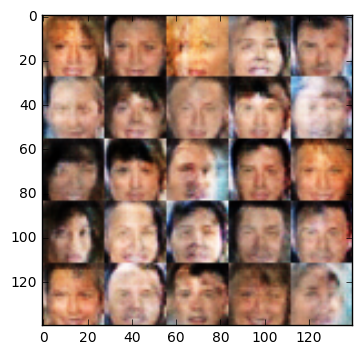

Epoch 1/1 Step3410... Discriminator Loss: 0.5945... Generator Loss: 1.2058
Epoch 1/1 Step3420... Discriminator Loss: 1.1941... Generator Loss: 0.4675
Epoch 1/1 Step3430... Discriminator Loss: 0.5423... Generator Loss: 1.2388
Epoch 1/1 Step3440... Discriminator Loss: 0.9533... Generator Loss: 0.6393
Epoch 1/1 Step3450... Discriminator Loss: 0.5833... Generator Loss: 1.5221
Epoch 1/1 Step3460... Discriminator Loss: 0.6196... Generator Loss: 1.1725
Epoch 1/1 Step3470... Discriminator Loss: 0.8426... Generator Loss: 3.4931
Epoch 1/1 Step3480... Discriminator Loss: 0.5267... Generator Loss: 1.3980
Epoch 1/1 Step3490... Discriminator Loss: 1.0260... Generator Loss: 0.6096
Epoch 1/1 Step3500... Discriminator Loss: 0.9783... Generator Loss: 0.6287


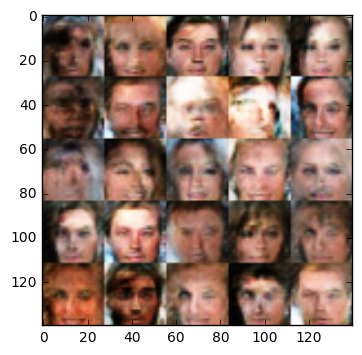

Epoch 1/1 Step3510... Discriminator Loss: 0.8248... Generator Loss: 0.8196
Epoch 1/1 Step3520... Discriminator Loss: 0.3568... Generator Loss: 1.6637
Epoch 1/1 Step3530... Discriminator Loss: 1.2605... Generator Loss: 0.4455
Epoch 1/1 Step3540... Discriminator Loss: 0.4447... Generator Loss: 1.7956
Epoch 1/1 Step3550... Discriminator Loss: 0.6514... Generator Loss: 2.8101
Epoch 1/1 Step3560... Discriminator Loss: 0.6168... Generator Loss: 1.1677
Epoch 1/1 Step3570... Discriminator Loss: 0.8856... Generator Loss: 0.7484
Epoch 1/1 Step3580... Discriminator Loss: 0.5352... Generator Loss: 1.3286
Epoch 1/1 Step3590... Discriminator Loss: 1.5449... Generator Loss: 0.3766
Epoch 1/1 Step3600... Discriminator Loss: 0.4372... Generator Loss: 2.4200


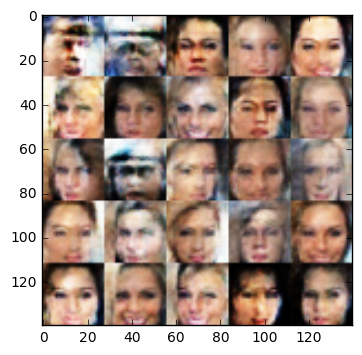

Epoch 1/1 Step3610... Discriminator Loss: 0.8947... Generator Loss: 0.8853
Epoch 1/1 Step3620... Discriminator Loss: 0.4444... Generator Loss: 1.6416
Epoch 1/1 Step3630... Discriminator Loss: 1.3900... Generator Loss: 0.3871
Epoch 1/1 Step3640... Discriminator Loss: 0.6397... Generator Loss: 1.0154
Epoch 1/1 Step3650... Discriminator Loss: 0.3973... Generator Loss: 1.5640
Epoch 1/1 Step3660... Discriminator Loss: 0.4851... Generator Loss: 2.1910
Epoch 1/1 Step3670... Discriminator Loss: 0.5303... Generator Loss: 1.2561
Epoch 1/1 Step3680... Discriminator Loss: 0.6961... Generator Loss: 1.0481
Epoch 1/1 Step3690... Discriminator Loss: 0.8809... Generator Loss: 0.6770
Epoch 1/1 Step3700... Discriminator Loss: 0.6389... Generator Loss: 1.3175


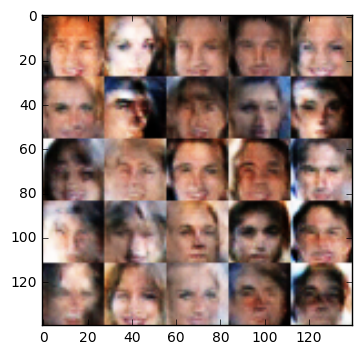

Epoch 1/1 Step3710... Discriminator Loss: 0.9108... Generator Loss: 0.8779
Epoch 1/1 Step3720... Discriminator Loss: 0.6217... Generator Loss: 1.0586
Epoch 1/1 Step3730... Discriminator Loss: 0.4817... Generator Loss: 1.4137
Epoch 1/1 Step3740... Discriminator Loss: 1.0451... Generator Loss: 4.3079
Epoch 1/1 Step3750... Discriminator Loss: 2.9644... Generator Loss: 6.4997
Epoch 1/1 Step3760... Discriminator Loss: 0.7812... Generator Loss: 0.7864
Epoch 1/1 Step3770... Discriminator Loss: 0.3670... Generator Loss: 2.0448
Epoch 1/1 Step3780... Discriminator Loss: 0.5376... Generator Loss: 1.3827
Epoch 1/1 Step3790... Discriminator Loss: 0.3163... Generator Loss: 2.9891
Epoch 1/1 Step3800... Discriminator Loss: 1.5394... Generator Loss: 0.3067


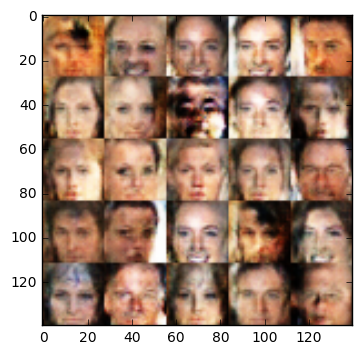

Epoch 1/1 Step3810... Discriminator Loss: 0.7093... Generator Loss: 1.7006
Epoch 1/1 Step3820... Discriminator Loss: 0.8928... Generator Loss: 0.7583
Epoch 1/1 Step3830... Discriminator Loss: 0.8319... Generator Loss: 0.7960
Epoch 1/1 Step3840... Discriminator Loss: 0.5526... Generator Loss: 1.3277
Epoch 1/1 Step3850... Discriminator Loss: 0.4062... Generator Loss: 2.0591
Epoch 1/1 Step3860... Discriminator Loss: 0.7387... Generator Loss: 3.0439
Epoch 1/1 Step3870... Discriminator Loss: 0.6008... Generator Loss: 1.5748
Epoch 1/1 Step3880... Discriminator Loss: 0.5380... Generator Loss: 1.3004
Epoch 1/1 Step3890... Discriminator Loss: 0.4955... Generator Loss: 1.8339
Epoch 1/1 Step3900... Discriminator Loss: 0.5194... Generator Loss: 1.5635


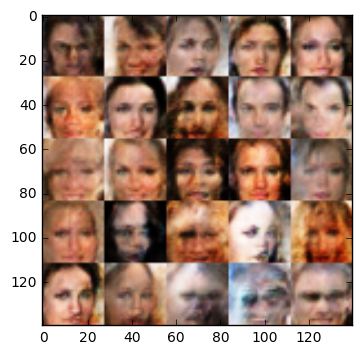

Epoch 1/1 Step3910... Discriminator Loss: 0.4798... Generator Loss: 1.4031
Epoch 1/1 Step3920... Discriminator Loss: 0.7651... Generator Loss: 0.8445
Epoch 1/1 Step3930... Discriminator Loss: 0.6449... Generator Loss: 1.1499
Epoch 1/1 Step3940... Discriminator Loss: 1.4677... Generator Loss: 0.3419
Epoch 1/1 Step3950... Discriminator Loss: 2.3212... Generator Loss: 0.1528
Epoch 1/1 Step3960... Discriminator Loss: 1.0888... Generator Loss: 0.6219
Epoch 1/1 Step3970... Discriminator Loss: 0.8447... Generator Loss: 0.8231
Epoch 1/1 Step3980... Discriminator Loss: 0.7250... Generator Loss: 3.4289
Epoch 1/1 Step3990... Discriminator Loss: 0.7766... Generator Loss: 0.7903
Epoch 1/1 Step4000... Discriminator Loss: 0.6234... Generator Loss: 3.9202


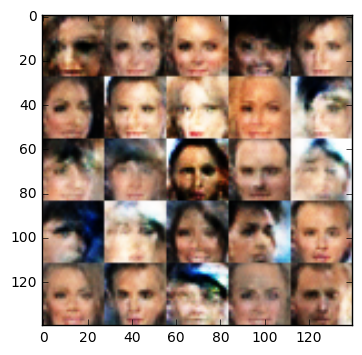

Epoch 1/1 Step4010... Discriminator Loss: 1.0448... Generator Loss: 0.6083
Epoch 1/1 Step4020... Discriminator Loss: 0.3970... Generator Loss: 1.4645
Epoch 1/1 Step4030... Discriminator Loss: 0.5584... Generator Loss: 1.1342
Epoch 1/1 Step4040... Discriminator Loss: 0.5527... Generator Loss: 1.7077
Epoch 1/1 Step4050... Discriminator Loss: 0.5289... Generator Loss: 1.6050
Epoch 1/1 Step4060... Discriminator Loss: 0.7512... Generator Loss: 0.9628
Epoch 1/1 Step4070... Discriminator Loss: 0.5400... Generator Loss: 1.2608
Epoch 1/1 Step4080... Discriminator Loss: 0.4071... Generator Loss: 2.3280
Epoch 1/1 Step4090... Discriminator Loss: 0.5493... Generator Loss: 1.3169
Epoch 1/1 Step4100... Discriminator Loss: 0.8578... Generator Loss: 0.8309


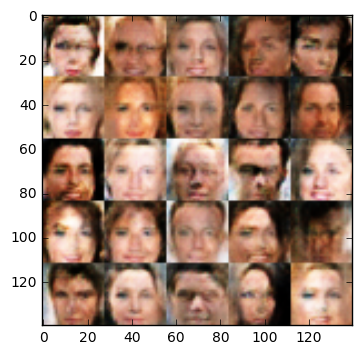

Epoch 1/1 Step4110... Discriminator Loss: 1.0128... Generator Loss: 0.6186
Epoch 1/1 Step4120... Discriminator Loss: 0.3807... Generator Loss: 1.8730
Epoch 1/1 Step4130... Discriminator Loss: 0.7032... Generator Loss: 5.6274
Epoch 1/1 Step4140... Discriminator Loss: 1.0614... Generator Loss: 0.6483
Epoch 1/1 Step4150... Discriminator Loss: 0.5351... Generator Loss: 1.2319
Epoch 1/1 Step4160... Discriminator Loss: 0.9061... Generator Loss: 0.7721
Epoch 1/1 Step4170... Discriminator Loss: 0.9006... Generator Loss: 0.6971
Epoch 1/1 Step4180... Discriminator Loss: 1.5947... Generator Loss: 0.3084
Epoch 1/1 Step4190... Discriminator Loss: 0.6335... Generator Loss: 2.6812
Epoch 1/1 Step4200... Discriminator Loss: 0.8710... Generator Loss: 0.8229


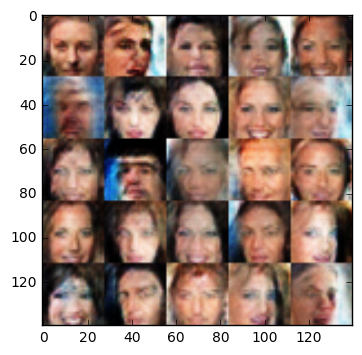

Epoch 1/1 Step4210... Discriminator Loss: 0.9569... Generator Loss: 0.6956
Epoch 1/1 Step4220... Discriminator Loss: 0.9600... Generator Loss: 0.6280
Epoch 1/1 Step4230... Discriminator Loss: 1.1804... Generator Loss: 0.5499
Epoch 1/1 Step4240... Discriminator Loss: 0.6191... Generator Loss: 3.1836
Epoch 1/1 Step4250... Discriminator Loss: 1.0112... Generator Loss: 3.1635
Epoch 1/1 Step4260... Discriminator Loss: 0.7340... Generator Loss: 0.8731
Epoch 1/1 Step4270... Discriminator Loss: 1.7315... Generator Loss: 0.2552
Epoch 1/1 Step4280... Discriminator Loss: 0.5900... Generator Loss: 2.5613
Epoch 1/1 Step4290... Discriminator Loss: 0.5623... Generator Loss: 1.9429
Epoch 1/1 Step4300... Discriminator Loss: 0.3844... Generator Loss: 1.7443


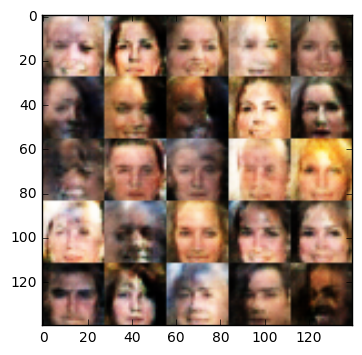

Epoch 1/1 Step4310... Discriminator Loss: 0.7152... Generator Loss: 2.7566
Epoch 1/1 Step4320... Discriminator Loss: 1.3726... Generator Loss: 0.4337
Epoch 1/1 Step4330... Discriminator Loss: 1.4157... Generator Loss: 0.3986
Epoch 1/1 Step4340... Discriminator Loss: 0.8185... Generator Loss: 0.9191
Epoch 1/1 Step4350... Discriminator Loss: 0.4240... Generator Loss: 1.7245
Epoch 1/1 Step4360... Discriminator Loss: 1.3434... Generator Loss: 0.4032
Epoch 1/1 Step4370... Discriminator Loss: 1.0186... Generator Loss: 0.5808
Epoch 1/1 Step4380... Discriminator Loss: 0.7142... Generator Loss: 0.9202
Epoch 1/1 Step4390... Discriminator Loss: 0.4860... Generator Loss: 1.7141
Epoch 1/1 Step4400... Discriminator Loss: 0.6289... Generator Loss: 2.8194


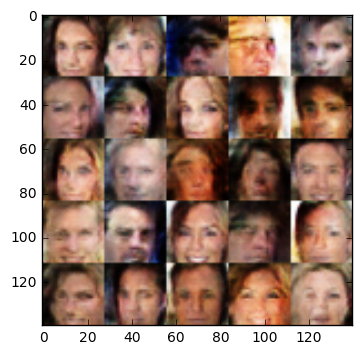

Epoch 1/1 Step4410... Discriminator Loss: 0.8760... Generator Loss: 0.8108
Epoch 1/1 Step4420... Discriminator Loss: 1.2183... Generator Loss: 0.4449
Epoch 1/1 Step4430... Discriminator Loss: 0.6126... Generator Loss: 1.2335
Epoch 1/1 Step4440... Discriminator Loss: 0.2562... Generator Loss: 2.3908
Epoch 1/1 Step4450... Discriminator Loss: 0.6249... Generator Loss: 2.0610
Epoch 1/1 Step4460... Discriminator Loss: 0.7043... Generator Loss: 1.0757
Epoch 1/1 Step4470... Discriminator Loss: 0.7050... Generator Loss: 1.0871
Epoch 1/1 Step4480... Discriminator Loss: 0.5392... Generator Loss: 1.2111
Epoch 1/1 Step4490... Discriminator Loss: 0.7392... Generator Loss: 3.4565
Epoch 1/1 Step4500... Discriminator Loss: 0.8524... Generator Loss: 0.7655


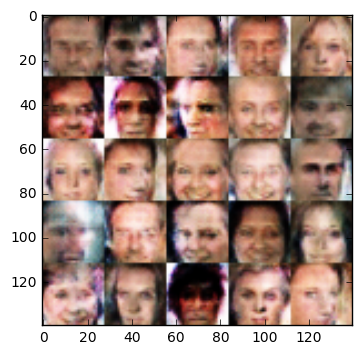

Epoch 1/1 Step4510... Discriminator Loss: 0.4537... Generator Loss: 1.6799
Epoch 1/1 Step4520... Discriminator Loss: 1.5574... Generator Loss: 0.3214
Epoch 1/1 Step4530... Discriminator Loss: 1.4991... Generator Loss: 4.1061
Epoch 1/1 Step4540... Discriminator Loss: 0.3999... Generator Loss: 1.6501
Epoch 1/1 Step4550... Discriminator Loss: 0.6257... Generator Loss: 1.2037
Epoch 1/1 Step4560... Discriminator Loss: 0.7309... Generator Loss: 0.9160
Epoch 1/1 Step4570... Discriminator Loss: 0.6578... Generator Loss: 1.0941
Epoch 1/1 Step4580... Discriminator Loss: 0.3709... Generator Loss: 1.6845
Epoch 1/1 Step4590... Discriminator Loss: 0.7153... Generator Loss: 0.8907
Epoch 1/1 Step4600... Discriminator Loss: 1.9510... Generator Loss: 0.2310


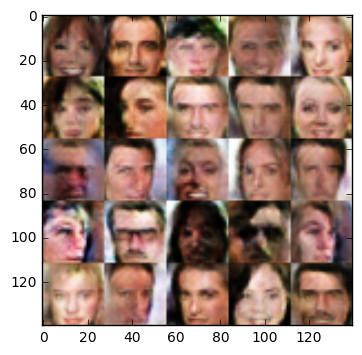

Epoch 1/1 Step4610... Discriminator Loss: 0.4691... Generator Loss: 1.8779
Epoch 1/1 Step4620... Discriminator Loss: 0.5112... Generator Loss: 1.2852
Epoch 1/1 Step4630... Discriminator Loss: 0.5409... Generator Loss: 2.4715
Epoch 1/1 Step4640... Discriminator Loss: 0.6090... Generator Loss: 1.1566
Epoch 1/1 Step4650... Discriminator Loss: 0.6912... Generator Loss: 0.8622
Epoch 1/1 Step4660... Discriminator Loss: 0.7567... Generator Loss: 0.8569
Epoch 1/1 Step4670... Discriminator Loss: 0.4365... Generator Loss: 1.8386
Epoch 1/1 Step4680... Discriminator Loss: 1.1632... Generator Loss: 0.5664
Epoch 1/1 Step4690... Discriminator Loss: 0.3733... Generator Loss: 2.3314
Epoch 1/1 Step4700... Discriminator Loss: 0.5126... Generator Loss: 1.6272


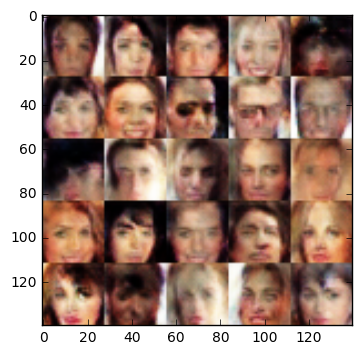

Epoch 1/1 Step4710... Discriminator Loss: 0.6755... Generator Loss: 2.3322
Epoch 1/1 Step4720... Discriminator Loss: 0.6124... Generator Loss: 1.0492
Epoch 1/1 Step4730... Discriminator Loss: 0.5449... Generator Loss: 1.6477
Epoch 1/1 Step4740... Discriminator Loss: 0.7615... Generator Loss: 0.9037
Epoch 1/1 Step4750... Discriminator Loss: 0.5069... Generator Loss: 2.3191
Epoch 1/1 Step4760... Discriminator Loss: 1.3565... Generator Loss: 0.3736
Epoch 1/1 Step4770... Discriminator Loss: 0.5020... Generator Loss: 3.3011
Epoch 1/1 Step4780... Discriminator Loss: 0.4870... Generator Loss: 1.7062
Epoch 1/1 Step4790... Discriminator Loss: 0.4654... Generator Loss: 1.5298
Epoch 1/1 Step4800... Discriminator Loss: 0.5810... Generator Loss: 2.0946


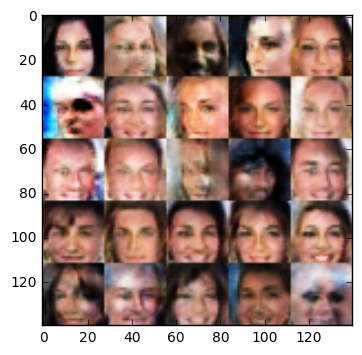

Epoch 1/1 Step4810... Discriminator Loss: 0.7983... Generator Loss: 2.0155
Epoch 1/1 Step4820... Discriminator Loss: 0.7592... Generator Loss: 0.9681
Epoch 1/1 Step4830... Discriminator Loss: 0.9320... Generator Loss: 0.6991
Epoch 1/1 Step4840... Discriminator Loss: 0.5130... Generator Loss: 2.5378
Epoch 1/1 Step4850... Discriminator Loss: 0.9186... Generator Loss: 0.7793
Epoch 1/1 Step4860... Discriminator Loss: 0.6541... Generator Loss: 1.8878
Epoch 1/1 Step4870... Discriminator Loss: 2.0670... Generator Loss: 0.1730
Epoch 1/1 Step4880... Discriminator Loss: 0.4050... Generator Loss: 1.8654
Epoch 1/1 Step4890... Discriminator Loss: 1.1483... Generator Loss: 3.1132
Epoch 1/1 Step4900... Discriminator Loss: 1.6944... Generator Loss: 0.3038


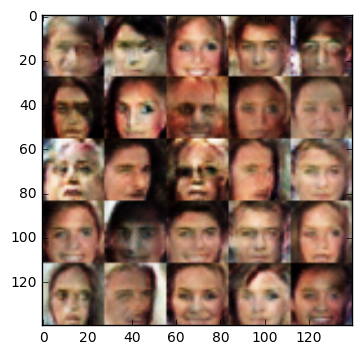

Epoch 1/1 Step4910... Discriminator Loss: 1.3147... Generator Loss: 0.5048
Epoch 1/1 Step4920... Discriminator Loss: 1.5348... Generator Loss: 0.3184
Epoch 1/1 Step4930... Discriminator Loss: 0.7974... Generator Loss: 1.0343
Epoch 1/1 Step4940... Discriminator Loss: 0.5949... Generator Loss: 1.2350
Epoch 1/1 Step4950... Discriminator Loss: 1.1792... Generator Loss: 0.4585
Epoch 1/1 Step4960... Discriminator Loss: 0.2970... Generator Loss: 2.4325
Epoch 1/1 Step4970... Discriminator Loss: 0.8272... Generator Loss: 0.8216
Epoch 1/1 Step4980... Discriminator Loss: 0.8438... Generator Loss: 0.8228
Epoch 1/1 Step4990... Discriminator Loss: 1.0005... Generator Loss: 0.7176
Epoch 1/1 Step5000... Discriminator Loss: 0.7437... Generator Loss: 2.8138


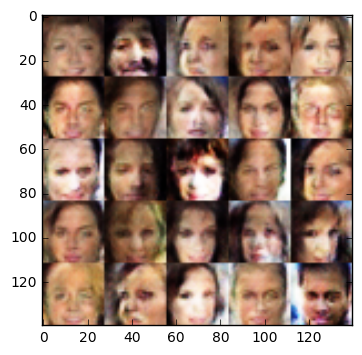

Epoch 1/1 Step5010... Discriminator Loss: 1.0497... Generator Loss: 0.5959
Epoch 1/1 Step5020... Discriminator Loss: 1.6846... Generator Loss: 0.4146
Epoch 1/1 Step5030... Discriminator Loss: 0.6506... Generator Loss: 1.1820
Epoch 1/1 Step5040... Discriminator Loss: 0.5510... Generator Loss: 1.3568
Epoch 1/1 Step5050... Discriminator Loss: 0.5013... Generator Loss: 1.9157
Epoch 1/1 Step5060... Discriminator Loss: 0.6525... Generator Loss: 0.9957
Epoch 1/1 Step5070... Discriminator Loss: 0.5659... Generator Loss: 2.0309
Epoch 1/1 Step5080... Discriminator Loss: 0.5193... Generator Loss: 1.3811
Epoch 1/1 Step5090... Discriminator Loss: 0.3669... Generator Loss: 1.6242
Epoch 1/1 Step5100... Discriminator Loss: 0.6366... Generator Loss: 2.0149


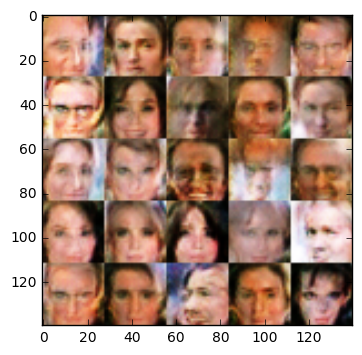

Epoch 1/1 Step5110... Discriminator Loss: 0.4522... Generator Loss: 1.9489
Epoch 1/1 Step5120... Discriminator Loss: 0.4389... Generator Loss: 1.5503
Epoch 1/1 Step5130... Discriminator Loss: 0.4833... Generator Loss: 1.5605
Epoch 1/1 Step5140... Discriminator Loss: 1.7488... Generator Loss: 0.2734
Epoch 1/1 Step5150... Discriminator Loss: 0.4843... Generator Loss: 1.3534
Epoch 1/1 Step5160... Discriminator Loss: 0.4447... Generator Loss: 1.4751
Epoch 1/1 Step5170... Discriminator Loss: 0.8190... Generator Loss: 0.7744
Epoch 1/1 Step5180... Discriminator Loss: 1.0301... Generator Loss: 0.5976
Epoch 1/1 Step5190... Discriminator Loss: 0.5392... Generator Loss: 1.5356
Epoch 1/1 Step5200... Discriminator Loss: 0.2064... Generator Loss: 2.6954


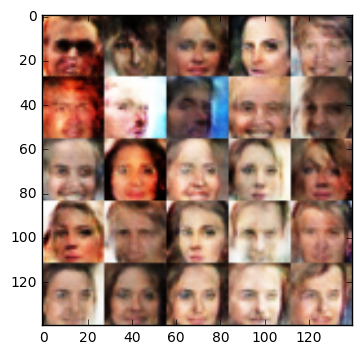

Epoch 1/1 Step5210... Discriminator Loss: 0.5530... Generator Loss: 1.4414
Epoch 1/1 Step5220... Discriminator Loss: 0.9357... Generator Loss: 0.6526
Epoch 1/1 Step5230... Discriminator Loss: 1.1404... Generator Loss: 0.5304
Epoch 1/1 Step5240... Discriminator Loss: 1.1097... Generator Loss: 0.7448
Epoch 1/1 Step5250... Discriminator Loss: 0.7403... Generator Loss: 0.9305
Epoch 1/1 Step5260... Discriminator Loss: 1.2724... Generator Loss: 0.4509
Epoch 1/1 Step5270... Discriminator Loss: 1.4521... Generator Loss: 0.3434
Epoch 1/1 Step5280... Discriminator Loss: 0.5065... Generator Loss: 1.3724
Epoch 1/1 Step5290... Discriminator Loss: 0.7938... Generator Loss: 2.2050
Epoch 1/1 Step5300... Discriminator Loss: 0.5195... Generator Loss: 1.7055


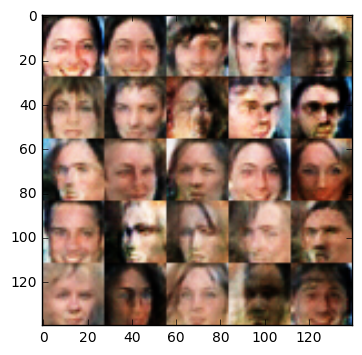

Epoch 1/1 Step5310... Discriminator Loss: 0.6625... Generator Loss: 0.9813
Epoch 1/1 Step5320... Discriminator Loss: 0.8924... Generator Loss: 3.4671
Epoch 1/1 Step5330... Discriminator Loss: 1.6626... Generator Loss: 0.3321
Epoch 1/1 Step5340... Discriminator Loss: 0.5165... Generator Loss: 2.0919
Epoch 1/1 Step5350... Discriminator Loss: 1.1001... Generator Loss: 0.5204
Epoch 1/1 Step5360... Discriminator Loss: 0.8617... Generator Loss: 3.0046
Epoch 1/1 Step5370... Discriminator Loss: 0.5442... Generator Loss: 1.9543
Epoch 1/1 Step5380... Discriminator Loss: 0.5607... Generator Loss: 1.5225
Epoch 1/1 Step5390... Discriminator Loss: 1.3043... Generator Loss: 0.4664
Epoch 1/1 Step5400... Discriminator Loss: 0.8081... Generator Loss: 1.9924


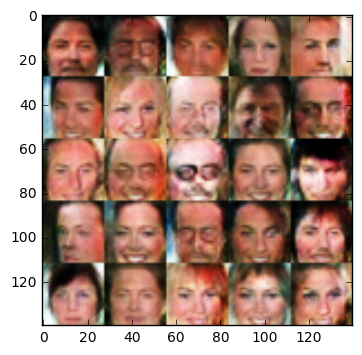

Epoch 1/1 Step5410... Discriminator Loss: 0.5894... Generator Loss: 2.5837
Epoch 1/1 Step5420... Discriminator Loss: 0.6829... Generator Loss: 1.0477
Epoch 1/1 Step5430... Discriminator Loss: 0.4351... Generator Loss: 1.7350
Epoch 1/1 Step5440... Discriminator Loss: 1.3057... Generator Loss: 0.4427
Epoch 1/1 Step5450... Discriminator Loss: 0.4491... Generator Loss: 2.6408
Epoch 1/1 Step5460... Discriminator Loss: 0.8466... Generator Loss: 2.7957
Epoch 1/1 Step5470... Discriminator Loss: 0.8458... Generator Loss: 0.7957
Epoch 1/1 Step5480... Discriminator Loss: 1.1430... Generator Loss: 0.5334
Epoch 1/1 Step5490... Discriminator Loss: 1.0447... Generator Loss: 0.5925
Epoch 1/1 Step5500... Discriminator Loss: 0.5143... Generator Loss: 1.5126


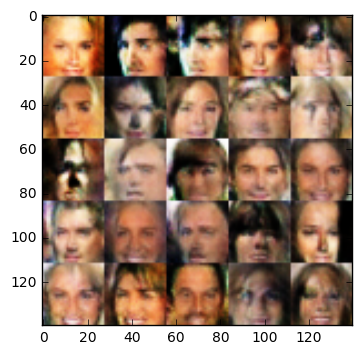

Epoch 1/1 Step5510... Discriminator Loss: 0.7675... Generator Loss: 2.9238
Epoch 1/1 Step5520... Discriminator Loss: 1.4360... Generator Loss: 0.4196
Epoch 1/1 Step5530... Discriminator Loss: 0.7604... Generator Loss: 2.0439
Epoch 1/1 Step5540... Discriminator Loss: 0.6272... Generator Loss: 1.1834
Epoch 1/1 Step5550... Discriminator Loss: 0.5979... Generator Loss: 1.2304
Epoch 1/1 Step5560... Discriminator Loss: 0.5344... Generator Loss: 3.4946
Epoch 1/1 Step5570... Discriminator Loss: 0.9827... Generator Loss: 0.6924
Epoch 1/1 Step5580... Discriminator Loss: 0.3592... Generator Loss: 1.9590
Epoch 1/1 Step5590... Discriminator Loss: 0.4165... Generator Loss: 1.9963
Epoch 1/1 Step5600... Discriminator Loss: 1.2133... Generator Loss: 0.4698


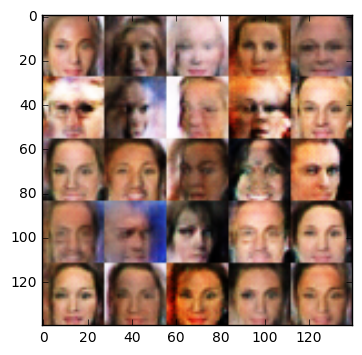

Epoch 1/1 Step5610... Discriminator Loss: 1.3519... Generator Loss: 0.4189
Epoch 1/1 Step5620... Discriminator Loss: 0.8514... Generator Loss: 0.8791
Epoch 1/1 Step5630... Discriminator Loss: 0.4345... Generator Loss: 2.4271
Epoch 1/1 Step5640... Discriminator Loss: 1.7987... Generator Loss: 0.2897
Epoch 1/1 Step5650... Discriminator Loss: 0.4093... Generator Loss: 1.9073
Epoch 1/1 Step5660... Discriminator Loss: 0.8435... Generator Loss: 0.7248
Epoch 1/1 Step5670... Discriminator Loss: 1.0322... Generator Loss: 0.6555
Epoch 1/1 Step5680... Discriminator Loss: 0.4090... Generator Loss: 1.9762
Epoch 1/1 Step5690... Discriminator Loss: 0.4398... Generator Loss: 1.9482
Epoch 1/1 Step5700... Discriminator Loss: 1.0140... Generator Loss: 0.6414


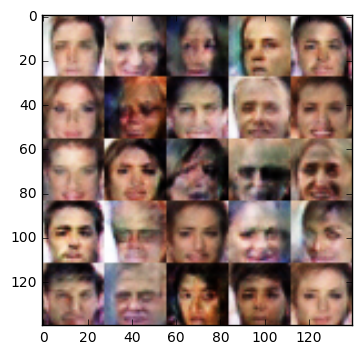

Epoch 1/1 Step5710... Discriminator Loss: 0.3568... Generator Loss: 1.8221
Epoch 1/1 Step5720... Discriminator Loss: 0.9898... Generator Loss: 0.5800
Epoch 1/1 Step5730... Discriminator Loss: 0.5654... Generator Loss: 1.3909
Epoch 1/1 Step5740... Discriminator Loss: 1.2271... Generator Loss: 3.7744
Epoch 1/1 Step5750... Discriminator Loss: 0.8038... Generator Loss: 0.7572
Epoch 1/1 Step5760... Discriminator Loss: 0.2467... Generator Loss: 2.2475
Epoch 1/1 Step5770... Discriminator Loss: 0.5063... Generator Loss: 1.6295
Epoch 1/1 Step5780... Discriminator Loss: 0.4001... Generator Loss: 2.2471
Epoch 1/1 Step5790... Discriminator Loss: 1.1109... Generator Loss: 0.5919
Epoch 1/1 Step5800... Discriminator Loss: 0.7273... Generator Loss: 1.8620


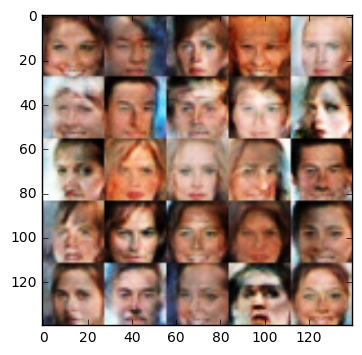

Epoch 1/1 Step5810... Discriminator Loss: 0.8173... Generator Loss: 0.9492
Epoch 1/1 Step5820... Discriminator Loss: 0.7310... Generator Loss: 3.4905
Epoch 1/1 Step5830... Discriminator Loss: 0.7397... Generator Loss: 0.9454
Epoch 1/1 Step5840... Discriminator Loss: 0.4275... Generator Loss: 1.4634
Epoch 1/1 Step5850... Discriminator Loss: 0.5735... Generator Loss: 1.1670
Epoch 1/1 Step5860... Discriminator Loss: 0.7816... Generator Loss: 0.8834
Epoch 1/1 Step5870... Discriminator Loss: 0.7992... Generator Loss: 1.0039
Epoch 1/1 Step5880... Discriminator Loss: 0.2854... Generator Loss: 2.0953
Epoch 1/1 Step5890... Discriminator Loss: 0.6374... Generator Loss: 1.2815
Epoch 1/1 Step5900... Discriminator Loss: 1.1288... Generator Loss: 0.5375


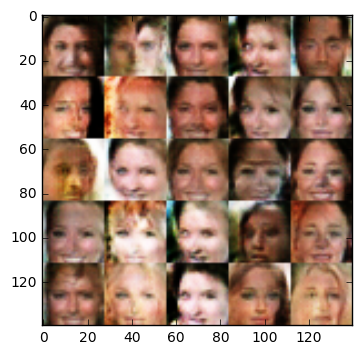

Epoch 1/1 Step5910... Discriminator Loss: 1.1046... Generator Loss: 0.5934
Epoch 1/1 Step5920... Discriminator Loss: 0.4073... Generator Loss: 1.5451
Epoch 1/1 Step5930... Discriminator Loss: 1.6187... Generator Loss: 0.2932
Epoch 1/1 Step5940... Discriminator Loss: 0.5158... Generator Loss: 1.2950
Epoch 1/1 Step5950... Discriminator Loss: 0.5131... Generator Loss: 1.3399
Epoch 1/1 Step5960... Discriminator Loss: 1.2798... Generator Loss: 3.6644
Epoch 1/1 Step5970... Discriminator Loss: 0.9404... Generator Loss: 4.3292
Epoch 1/1 Step5980... Discriminator Loss: 0.4900... Generator Loss: 2.4298
Epoch 1/1 Step5990... Discriminator Loss: 1.2490... Generator Loss: 0.4764
Epoch 1/1 Step6000... Discriminator Loss: 0.4494... Generator Loss: 1.8085


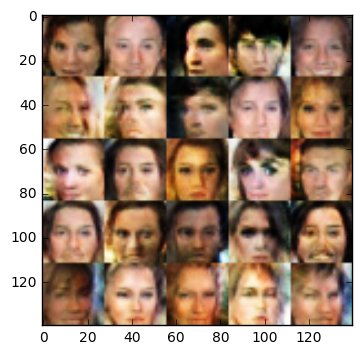

Epoch 1/1 Step6010... Discriminator Loss: 1.0852... Generator Loss: 0.5737
Epoch 1/1 Step6020... Discriminator Loss: 0.8155... Generator Loss: 0.7271
Epoch 1/1 Step6030... Discriminator Loss: 0.5713... Generator Loss: 1.2742
Epoch 1/1 Step6040... Discriminator Loss: 0.3467... Generator Loss: 1.8544
Epoch 1/1 Step6050... Discriminator Loss: 0.3600... Generator Loss: 1.9089
Epoch 1/1 Step6060... Discriminator Loss: 0.4428... Generator Loss: 1.5488
Epoch 1/1 Step6070... Discriminator Loss: 0.4807... Generator Loss: 2.3494
Epoch 1/1 Step6080... Discriminator Loss: 0.5359... Generator Loss: 3.4812
Epoch 1/1 Step6090... Discriminator Loss: 0.5314... Generator Loss: 2.8767
Epoch 1/1 Step6100... Discriminator Loss: 0.4699... Generator Loss: 1.3046


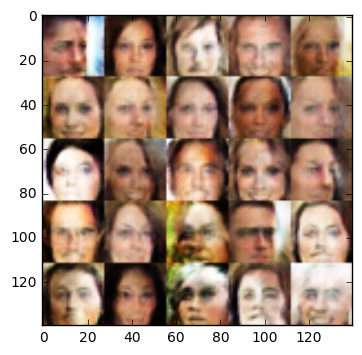

Epoch 1/1 Step6110... Discriminator Loss: 0.6381... Generator Loss: 1.0160
Epoch 1/1 Step6120... Discriminator Loss: 0.5294... Generator Loss: 2.4766
Epoch 1/1 Step6130... Discriminator Loss: 0.7031... Generator Loss: 0.9418
Epoch 1/1 Step6140... Discriminator Loss: 0.6973... Generator Loss: 0.9821
Epoch 1/1 Step6150... Discriminator Loss: 0.6019... Generator Loss: 1.9089
Epoch 1/1 Step6160... Discriminator Loss: 0.4537... Generator Loss: 3.7784
Epoch 1/1 Step6170... Discriminator Loss: 1.2310... Generator Loss: 0.5520
Epoch 1/1 Step6180... Discriminator Loss: 0.6321... Generator Loss: 1.3212
Epoch 1/1 Step6190... Discriminator Loss: 0.6753... Generator Loss: 0.9553
Epoch 1/1 Step6200... Discriminator Loss: 0.4167... Generator Loss: 1.5649


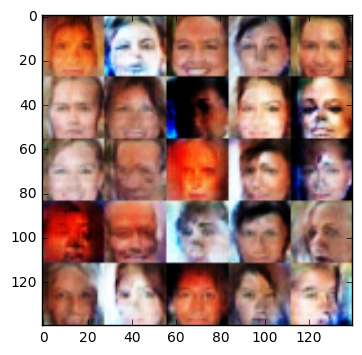

Epoch 1/1 Step6210... Discriminator Loss: 0.4035... Generator Loss: 2.0467
Epoch 1/1 Step6220... Discriminator Loss: 0.5694... Generator Loss: 1.2598
Epoch 1/1 Step6230... Discriminator Loss: 0.4032... Generator Loss: 2.1696
Epoch 1/1 Step6240... Discriminator Loss: 0.3739... Generator Loss: 1.7508
Epoch 1/1 Step6250... Discriminator Loss: 1.6403... Generator Loss: 0.3620
Epoch 1/1 Step6260... Discriminator Loss: 0.4097... Generator Loss: 1.8586
Epoch 1/1 Step6270... Discriminator Loss: 0.9780... Generator Loss: 0.6471
Epoch 1/1 Step6280... Discriminator Loss: 1.3233... Generator Loss: 0.4050
Epoch 1/1 Step6290... Discriminator Loss: 0.7274... Generator Loss: 0.8779
Epoch 1/1 Step6300... Discriminator Loss: 0.7563... Generator Loss: 0.9381


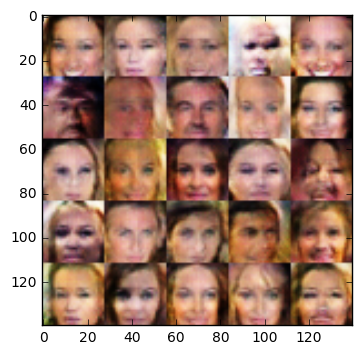

Epoch 1/1 Step6310... Discriminator Loss: 0.5409... Generator Loss: 1.3577
Epoch 1/1 Step6320... Discriminator Loss: 0.4831... Generator Loss: 1.5637
Epoch 1/1 Step6330... Discriminator Loss: 0.6902... Generator Loss: 1.0086


In [13]:
batch_size = 32
z_dim = 100
learning_rate = 0.0006
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.